In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [3]:
mg = sc.read_h5ad(r"/mnt/g/Levi_Jon/combined.h5ad")

In [26]:
mgtotal = sc.read_h5ad(r"/mnt/g/Levi_Jon/combined.h5ad")

In [4]:
mg.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,S.Score,G2M.Score,Phase,percent.mt,RNA_snn_res.0.5,seurat_clusters,pANN_0.25_0.04_241,DF.classifications_0.25_0.04_241,DF.classifications_0.25_0.04_191,pANN_0.25_0.06_182,DF.classifications_0.25_0.06_182,DF.classifications_0.25_0.06_153,integrated_snn_res.0.5
AAACCCAGTAGCTGCC-1_1,late,1557.0,1027,11.368015,-0.027778,-0.033397,G1,4.945408,0,0,0.015504,Singlet,Singlet,NaN,NA,NA,0
AAACCCAGTGTTGAGG-1_1,late,1139.0,763,1.053556,-0.000618,-0.010960,G1,10.711150,3,3,0.031008,Singlet,Singlet,NaN,NA,NA,3
AAACGAAAGCAACTCT-1_1,late,2946.0,1756,7.399864,0.004769,-0.065160,S,4.073320,1,2,0.217054,Singlet,Singlet,NaN,NA,NA,2
AAACGAACACATGTTG-1_1,late,931.0,621,1.611171,0.040806,-0.015264,S,3.866810,3,3,0.007752,Singlet,Singlet,NaN,NA,NA,3
AAACGCTAGCTCTGTA-1_1,late,3233.0,1823,8.660687,-0.001237,0.142516,G2M,3.154964,1,1,0.155039,Singlet,Singlet,NaN,NA,NA,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTCCTCAGG-1_2,early,3166.0,1687,11.939356,-0.060528,0.077702,G2M,7.548958,2,4,NaN,NA,NA,0.006897,Singlet,Singlet,4
TTTGGTTTCTCTCCGA-1_2,early,4794.0,2441,9.198999,-0.013216,-0.055211,G1,6.633292,0,2,NaN,NA,NA,0.124138,Singlet,Singlet,2
TTTGTTGAGGTCGACA-1_2,early,5595.0,2637,10.241287,-0.056890,-0.102094,G1,8.918677,8,9,NaN,NA,NA,0.213793,Singlet,Singlet,9
TTTGTTGCAGTGCGCT-1_2,early,3848.0,1914,12.733888,0.054813,0.040794,S,8.030146,2,4,NaN,NA,NA,0.034483,Singlet,Singlet,4


In [5]:
sc.pp.pca(mg)
pca_projections = pd.DataFrame(mg.obsm["X_pca"],index=mg.obs_names)

computing PCA
    with n_comps=50
    finished (0:00:05)


In [6]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)


In [7]:
# generate neighbor draph in multiscale diffusion space
mg.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(mg,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [8]:
# draw ForceAtlas2 embedding using 3 first PCs as initial positions
mg.obsm["X_pca2d"]=mg.obsm["X_pca"][:,:3]
sc.tl.draw_graph(mg, layout = 'fa',init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:26)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


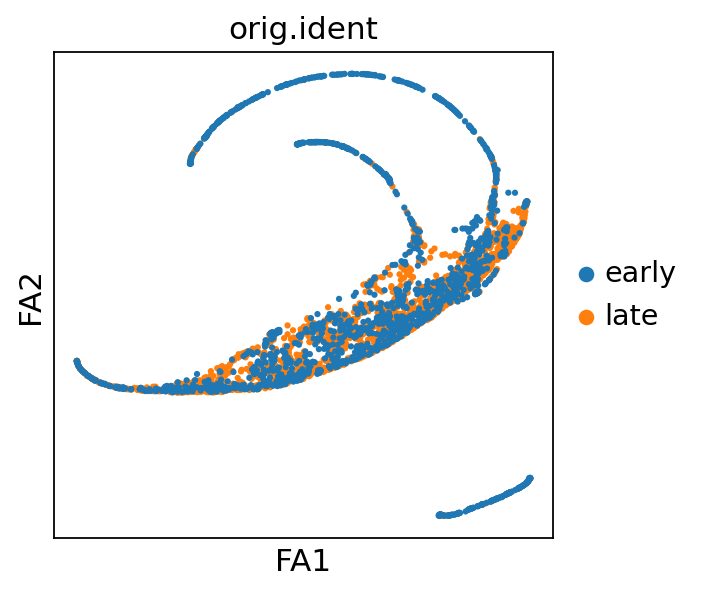

In [9]:
sc.pl.draw_graph(mg,color=['orig.ident'], layout = 'fa') #WE USE THAT

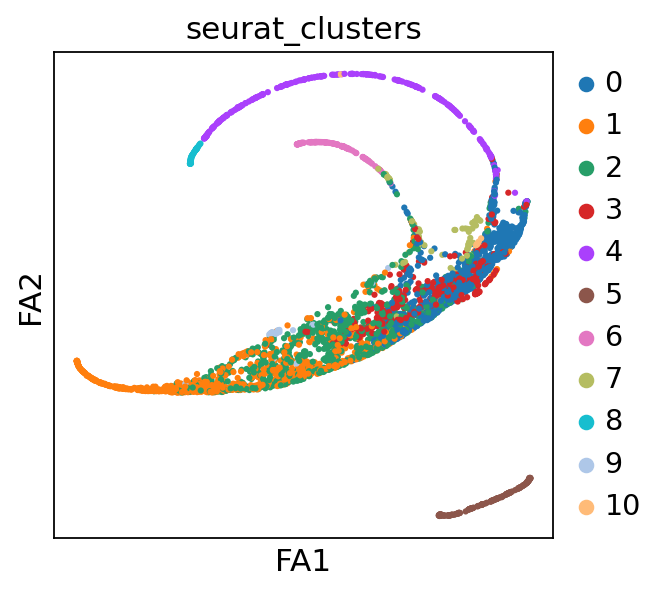

In [21]:
sc.pl.draw_graph(mg,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

In [22]:
old_to_new = {
'0':'Transitory',
'1':'Transitory',
'2':'Transitory',
'3':'Transitory',
'4':'Partially muller glia',
'5':'Microglia',
'6':'RGC',
'7':'Cones',
'8':'Mature muller glia',
'9':'AC',
'10':'Early neurons'}
mg.obs['EK_anno'] = (
mg.obs['seurat_clusters']
.map(old_to_new).astype('category')
)

In [15]:
mg.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,S.Score,G2M.Score,Phase,percent.mt,RNA_snn_res.0.5,seurat_clusters,pANN_0.25_0.04_241,DF.classifications_0.25_0.04_241,DF.classifications_0.25_0.04_191,pANN_0.25_0.06_182,DF.classifications_0.25_0.06_182,DF.classifications_0.25_0.06_153,integrated_snn_res.0.5,EK_anno
AAACCCAGTAGCTGCC-1_1,late,1557.0,1027,11.368015,-0.027778,-0.033397,G1,4.945408,0,0,0.015504,Singlet,Singlet,NaN,NA,NA,0,NaN
AAACCCAGTGTTGAGG-1_1,late,1139.0,763,1.053556,-0.000618,-0.010960,G1,10.711150,3,3,0.031008,Singlet,Singlet,NaN,NA,NA,3,NaN
AAACGAAAGCAACTCT-1_1,late,2946.0,1756,7.399864,0.004769,-0.065160,S,4.073320,1,2,0.217054,Singlet,Singlet,NaN,NA,NA,2,NaN
AAACGAACACATGTTG-1_1,late,931.0,621,1.611171,0.040806,-0.015264,S,3.866810,3,3,0.007752,Singlet,Singlet,NaN,NA,NA,3,NaN
AAACGCTAGCTCTGTA-1_1,late,3233.0,1823,8.660687,-0.001237,0.142516,G2M,3.154964,1,1,0.155039,Singlet,Singlet,NaN,NA,NA,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTCCTCAGG-1_2,early,3166.0,1687,11.939356,-0.060528,0.077702,G2M,7.548958,2,4,NaN,NA,NA,0.006897,Singlet,Singlet,4,NaN
TTTGGTTTCTCTCCGA-1_2,early,4794.0,2441,9.198999,-0.013216,-0.055211,G1,6.633292,0,2,NaN,NA,NA,0.124138,Singlet,Singlet,2,NaN
TTTGTTGAGGTCGACA-1_2,early,5595.0,2637,10.241287,-0.056890,-0.102094,G1,8.918677,8,9,NaN,NA,NA,0.213793,Singlet,Singlet,9,NaN
TTTGTTGCAGTGCGCT-1_2,early,3848.0,1914,12.733888,0.054813,0.040794,S,8.030146,2,4,NaN,NA,NA,0.034483,Singlet,Singlet,4,NaN


In [16]:
import pandas as pd

In [20]:
mg.obs['seurat_clusters'] = mg.obs['seurat_clusters'].astype(str)

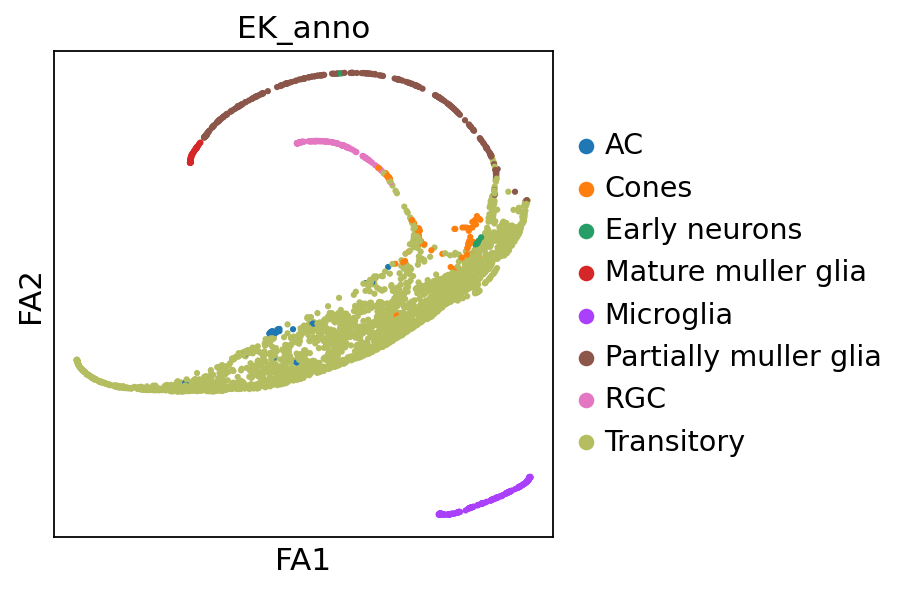

In [23]:
sc.pl.draw_graph(mg,color=['EK_anno'], layout = 'fa') #WE USE THAT

In [24]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

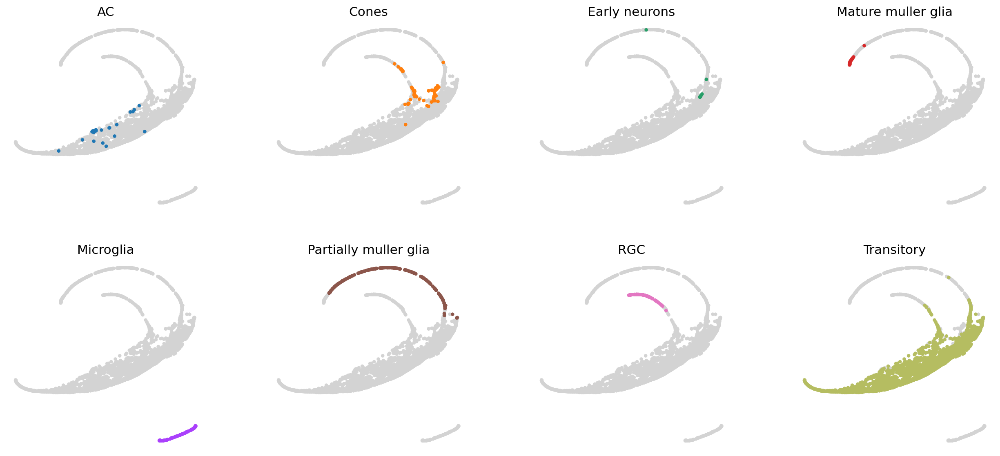

In [25]:
cluster_small_multiples(mg, clust_key = 'EK_anno', layout = 'fa')

In [27]:
sc.pp.highly_variable_genes(mgtotal, n_top_genes=1500, flavor='cell_ranger')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [28]:
mgtotal.var

,features,highly_variable,means,dispersions,dispersions_norm
Cst3,Cst3,True,-4.260619e-16,-2.347077e+15,0.458819
C1qa,C1qa,True,-5.124484e-15,-1.951416e+14,0.653712
Ctss,Ctss,True,8.616188e-16,1.160606e+15,1.146605
Apoe,Apoe,True,-2.379658e-15,-4.202285e+14,-0.431381
C1qb,C1qb,True,-3.801405e-15,-2.630606e+14,0.326290
...,...,...,...,...,...
Sh3gl3,Sh3gl3,False,-3.011035e-16,-3.321117e+15,-0.858541
Flrt1,Flrt1,False,-3.985397e-17,-2.509160e+16,-2.641992
Lpcat1,Lpcat1,True,9.745810e-17,1.026082e+16,0.011560
Zfc3h1,Zfc3h1,True,5.866228e-16,1.704673e+15,0.085500


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:25)


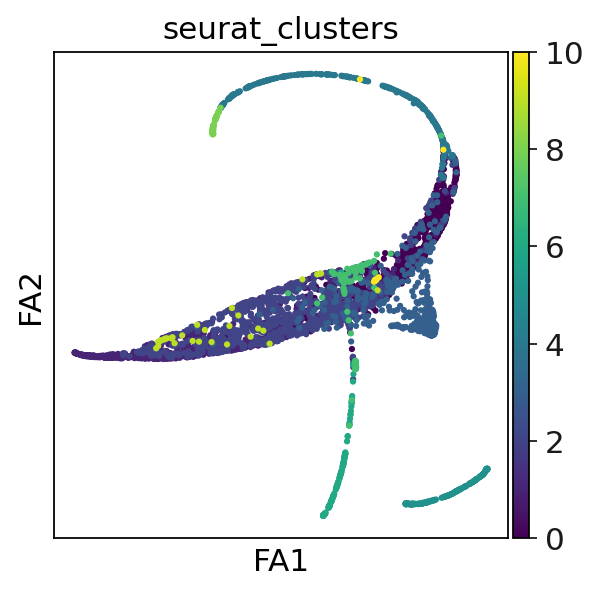

In [30]:
sc.pp.pca(mgtotal)
pca_projections = pd.DataFrame(mgtotal.obsm["X_pca"],index=mgtotal.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
mgtotal.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(mgtotal,n_neighbors=30,use_rep="X_palantir")
mgtotal.obsm["X_pca2d"]=mgtotal.obsm["X_pca"][:,:3]
sc.tl.draw_graph(mgtotal, layout = 'fa',init_pos='X_pca2d')
sc.pl.draw_graph(mgtotal,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

In [31]:
mgtotal.obs['seurat_clusters'] = mgtotal.obs['seurat_clusters'].astype(str)

In [32]:
old_to_new = {
'0':'Transitory',
'1':'Transitory',
'2':'Transitory',
'3':'Transitory',
'4':'Partially muller glia',
'5':'Microglia',
'6':'RGC',
'7':'Cones',
'8':'Mature muller glia',
'9':'AC',
'10':'Early neurons'}
mgtotal.obs['EK_anno'] = (
mgtotal.obs['seurat_clusters']
.map(old_to_new).astype('category')
)

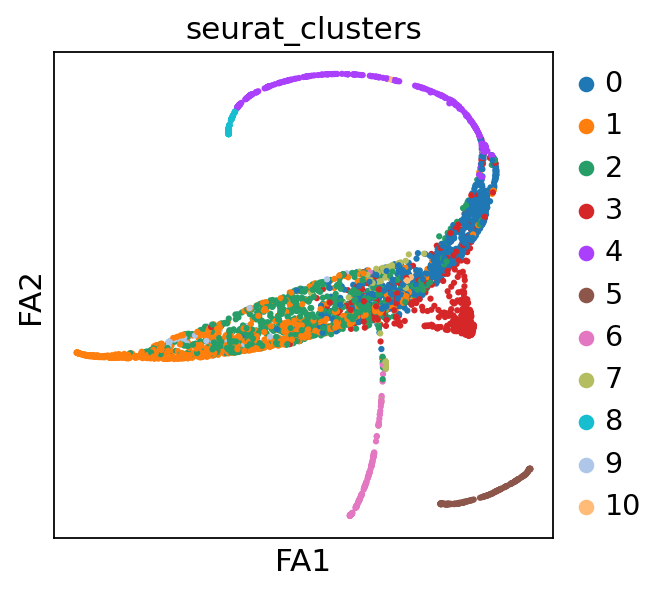

In [33]:
sc.pl.draw_graph(mgtotal,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

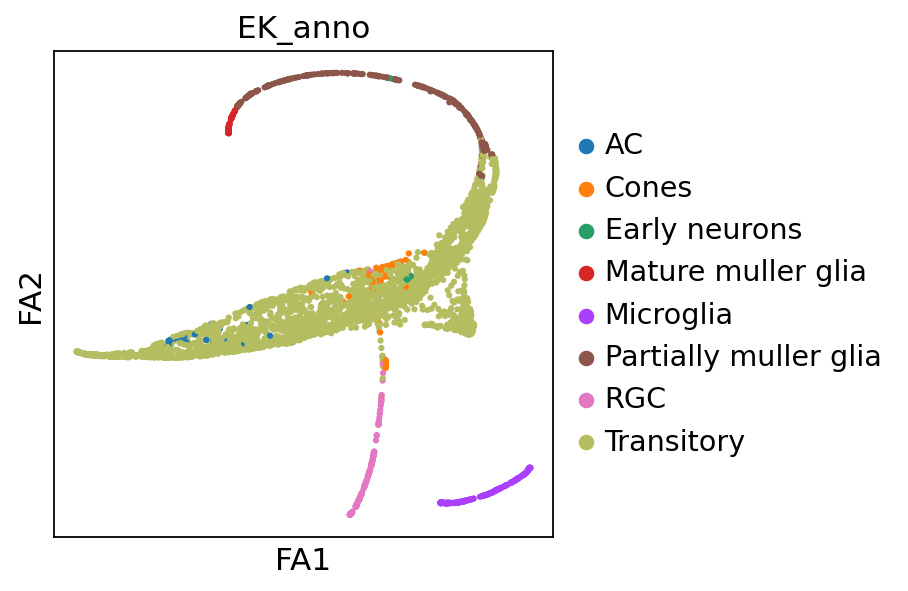

In [34]:
sc.pl.draw_graph(mgtotal,color=['EK_anno'], layout = 'fa') #WE USE THAT

In [ ]:
mgtotal.obsm['X_draw_graph_fa'] = mg.obsm['X_draw_graph_fa']

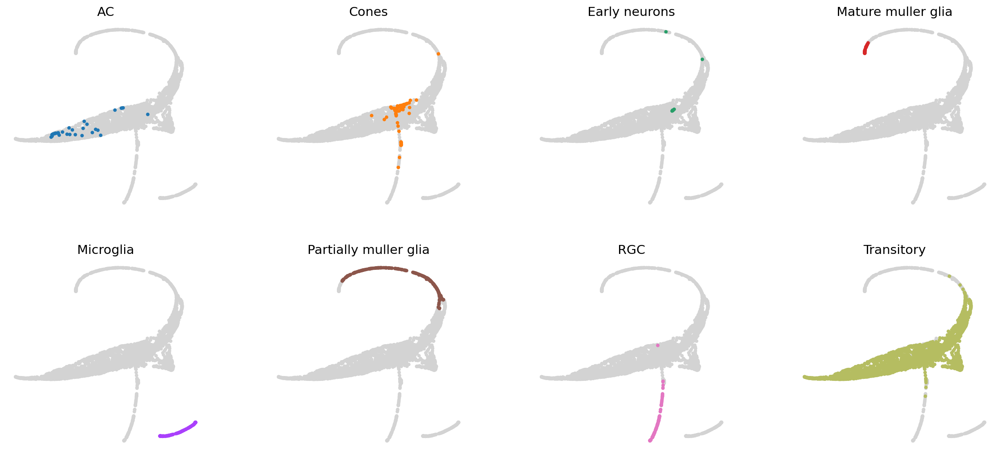

In [35]:
cluster_small_multiples(mgtotal, clust_key = 'EK_anno', layout = 'fa')

In [36]:
import scvelo as scv

In [38]:
I = scv.read("/mnt/g/Levi_Jon/early/velocyto/early.loom", cache = True)
UI = scv.read("/mnt/g/Levi_Jon/late/Ascl1_Atoh1_late_timepoint/velocyto/Ascl1_Atoh1_late_timepoint.loom", cache = True)

... reading from cache file cache/mnt-g-Levi_Jon-early-velocyto-early.h5ad
... writing an h5ad cache file to speedup reading next time


In [40]:
early = mg[mg.obs['orig.ident'].isin(['early'])]

In [41]:
late = mg[mg.obs['orig.ident'].isin(['late'])]

In [60]:
loom = I.concatenate([UI])

In [42]:
early_velo = scv.utils.merge(early, I)
late_velo = scv.utils.merge(late, UI)

In [61]:
mg_velo = scv.utils.merge(mg, loom)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


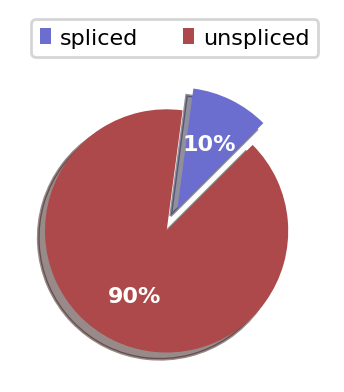

In [43]:
scv.pl.proportions(early_velo)

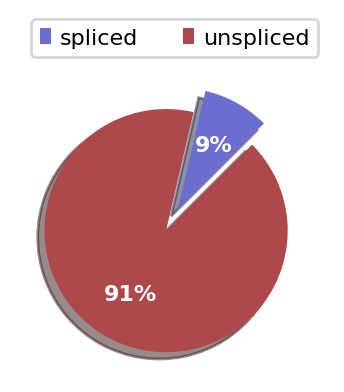

In [44]:
scv.pl.proportions(late_velo)

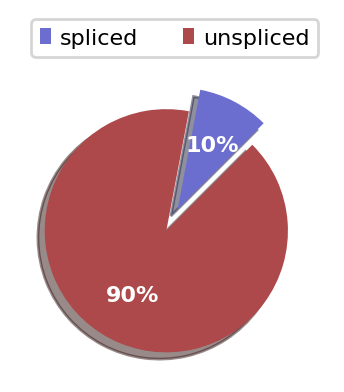

In [62]:
scv.pl.proportions(mg_velo)

In [45]:
scv.pp.filter_and_normalize(early_velo, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(early_velo, n_pcs=30, n_neighbors=30)
scv.pp.filter_and_normalize(late_velo, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(late_velo, n_pcs=30, n_neighbors=30)

Filtered out 1860 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Filtered out 1912 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [63]:
scv.pp.filter_and_normalize(mg_velo, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(mg_velo, n_pcs=30, n_neighbors=30)

Filtered out 1829 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [46]:
scv.tl.velocity(early_velo)
scv.tl.velocity(late_velo)


computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [64]:
scv.tl.velocity(mg_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [49]:
scv.tl.velocity_graph(early_velo)
scv.tl.velocity_graph(late_velo)

or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing velocity graph (using 1/12 cores)


  0%|          | 0/1634 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/12 cores)


  0%|          | 0/2172 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [65]:
scv.tl.velocity_graph(mg_velo)

computing velocity graph (using 1/12 cores)


  0%|          | 0/3806 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [48]:
sc.pp.neighbors(late_velo)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


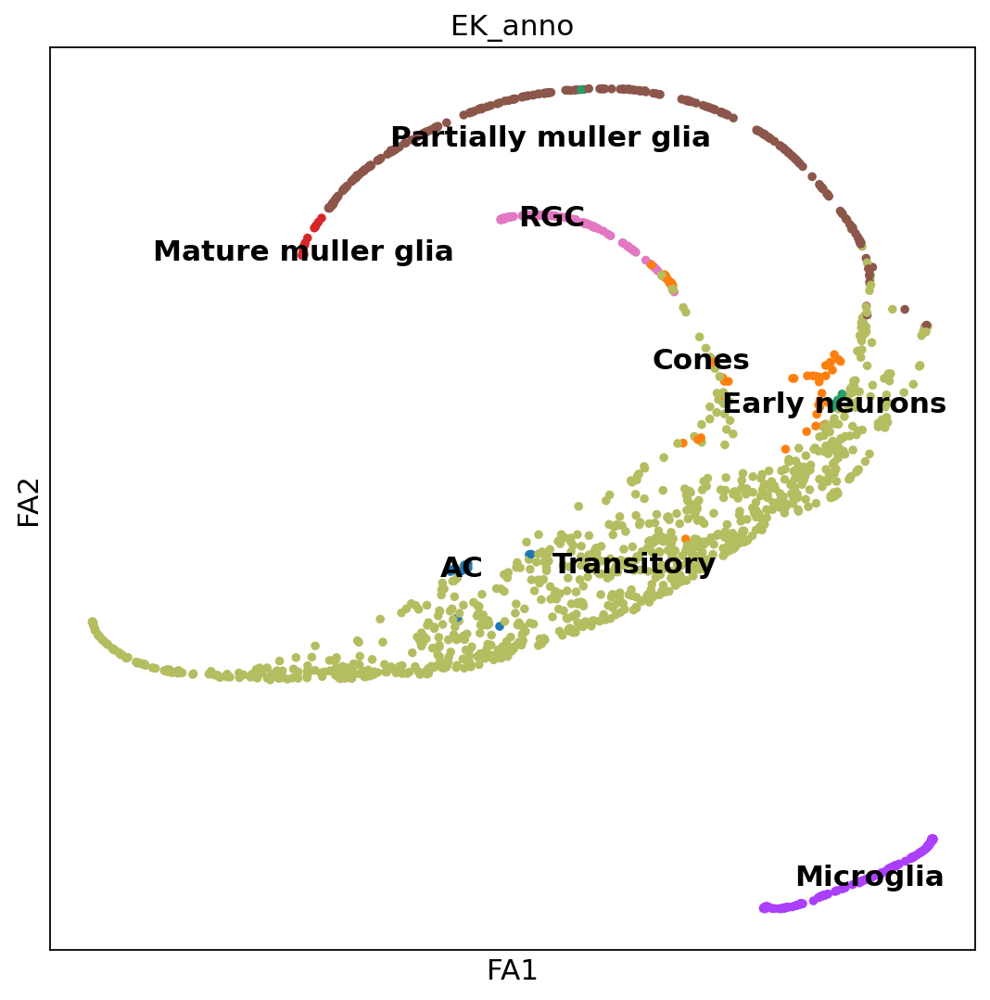

In [53]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(early_velo,color=['EK_anno'], layout = 'fa', legend_loc = 'on data',use_raw=False)

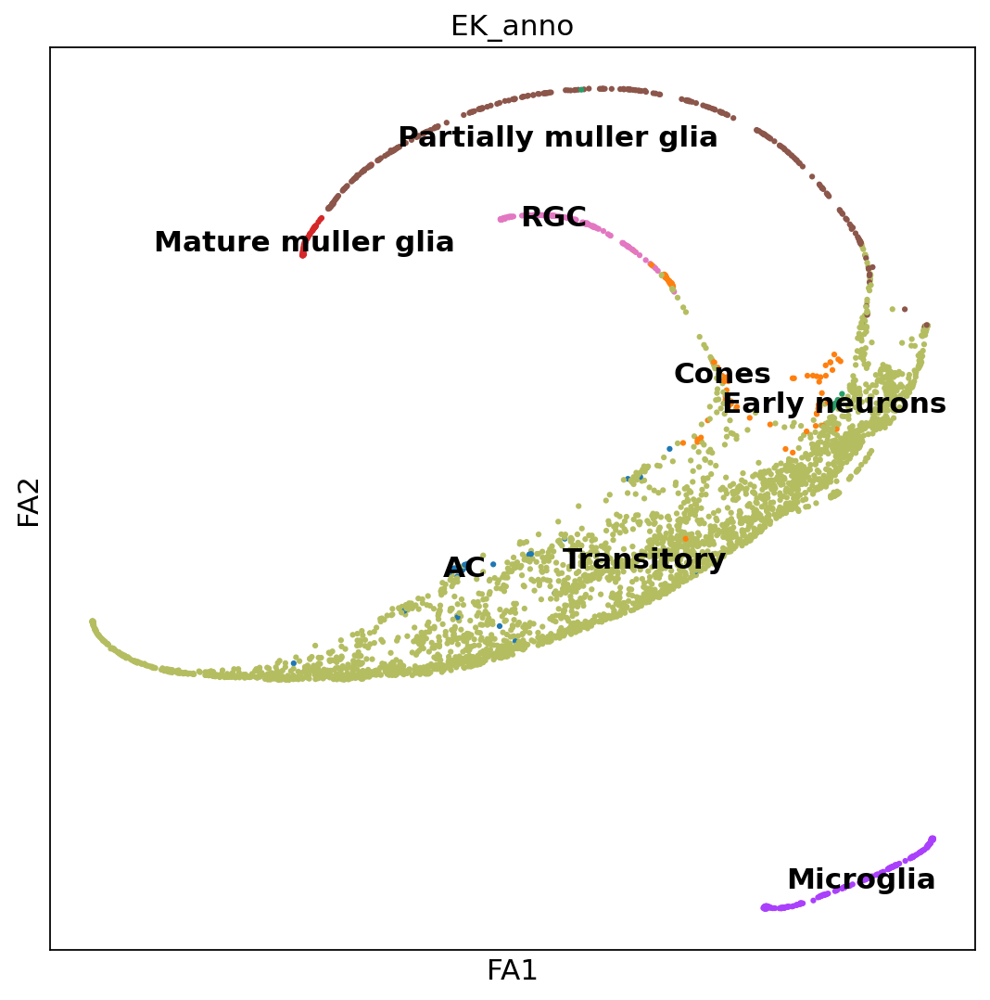

In [66]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(mg_velo,color=['EK_anno'], layout = 'fa', legend_loc = 'on data',use_raw=False)

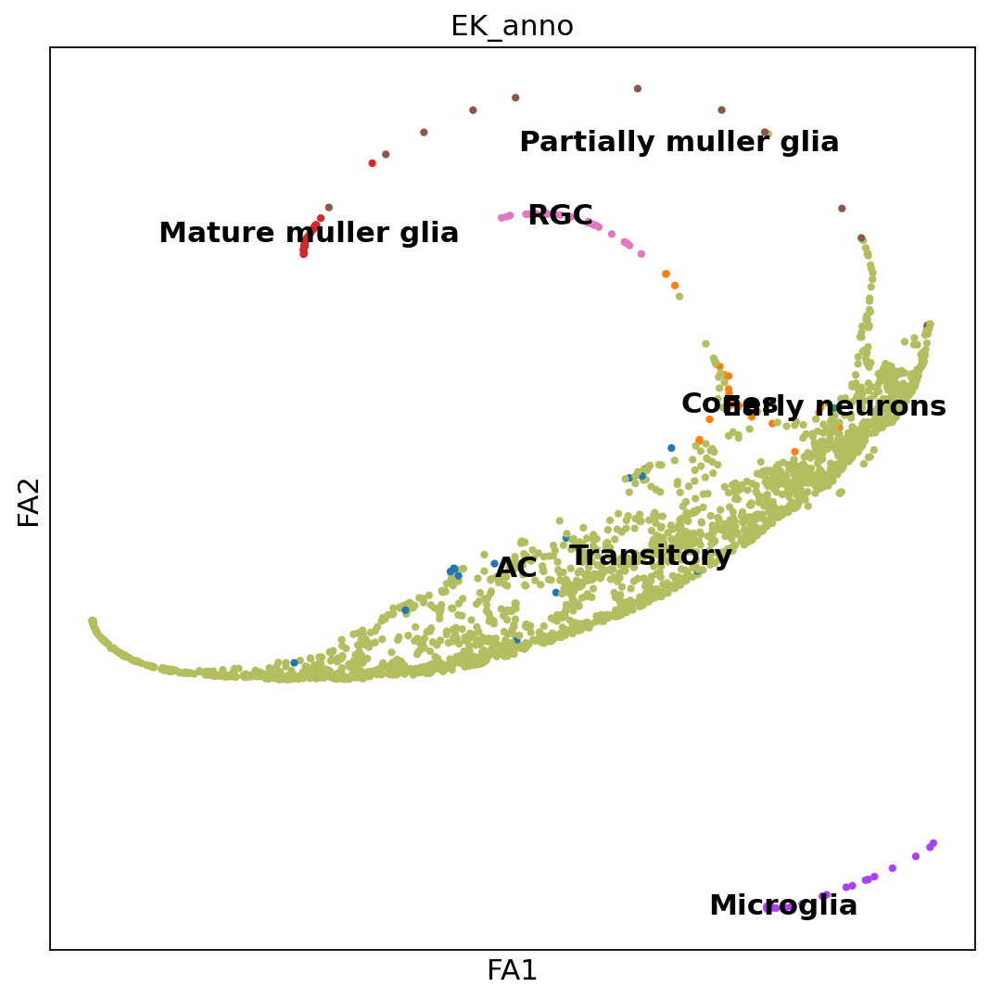

In [54]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(late_velo,color=['EK_anno'], layout = 'fa', legend_loc = 'on data',use_raw=False)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


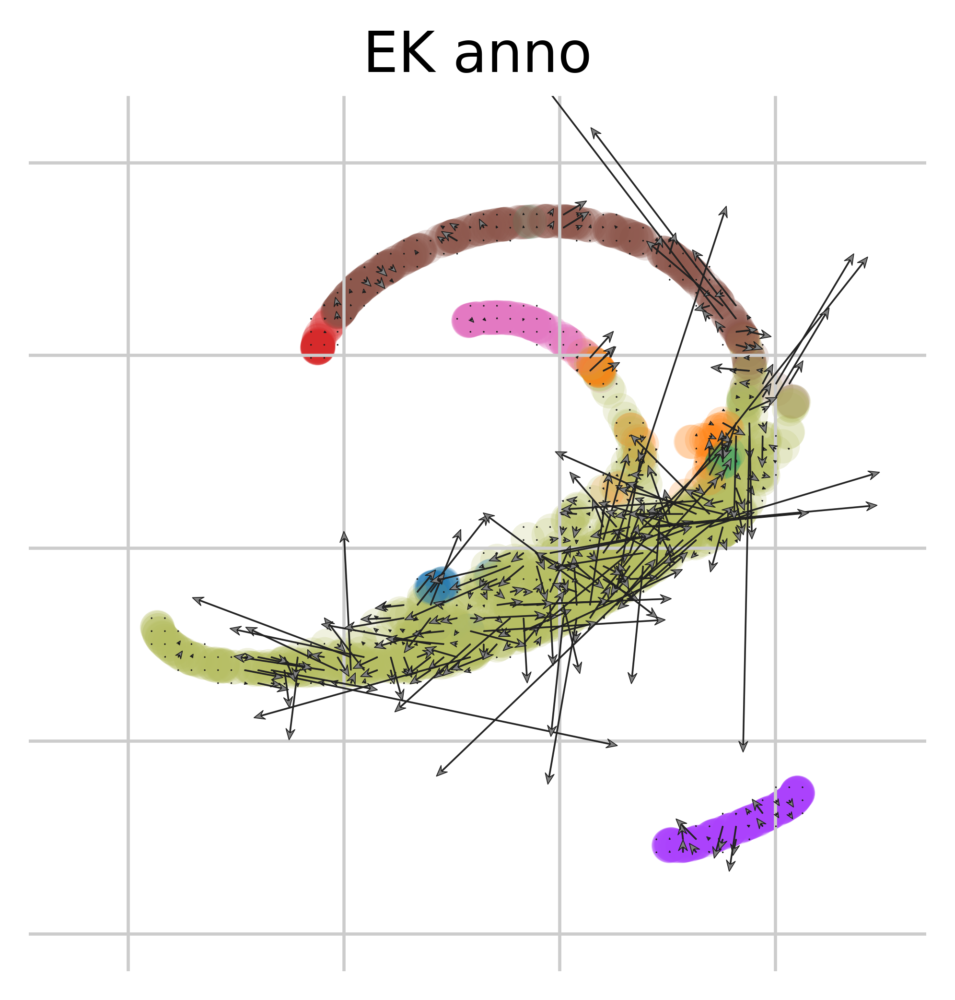

In [55]:
scv.pl.velocity_embedding_grid(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


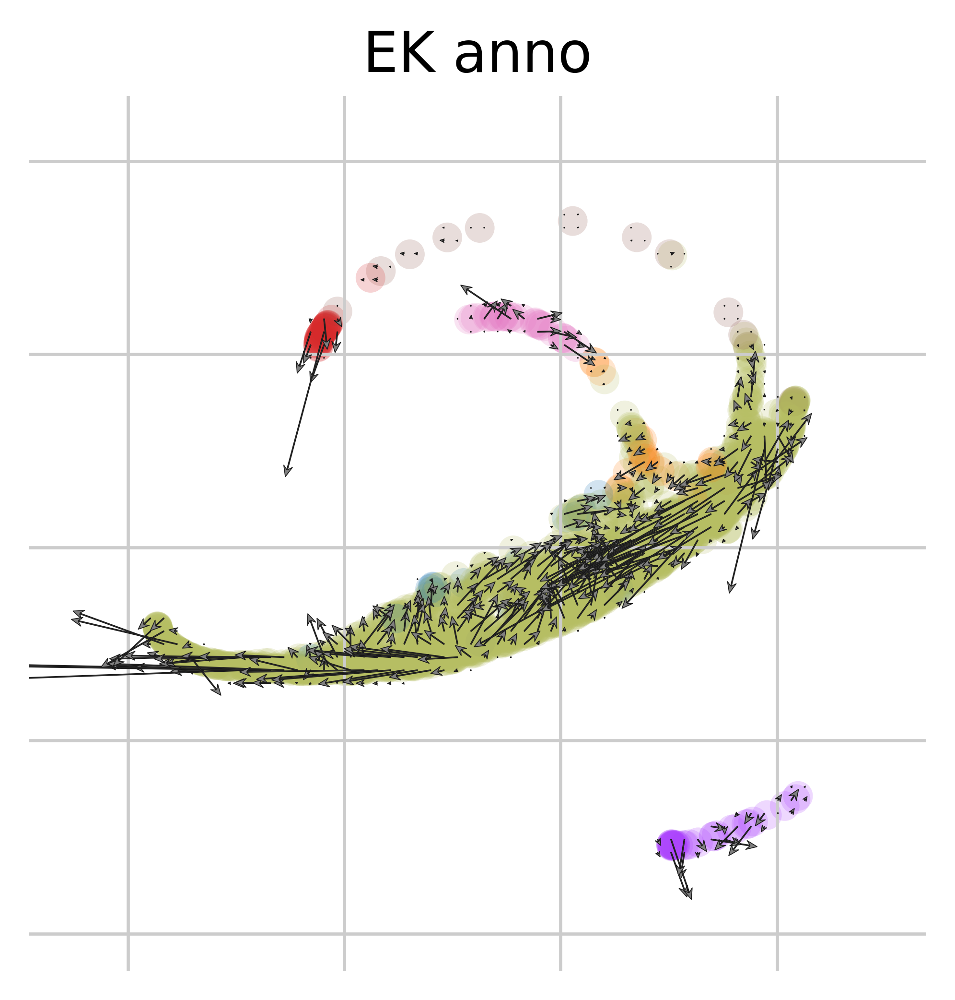

In [56]:
scv.pl.velocity_embedding_grid(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

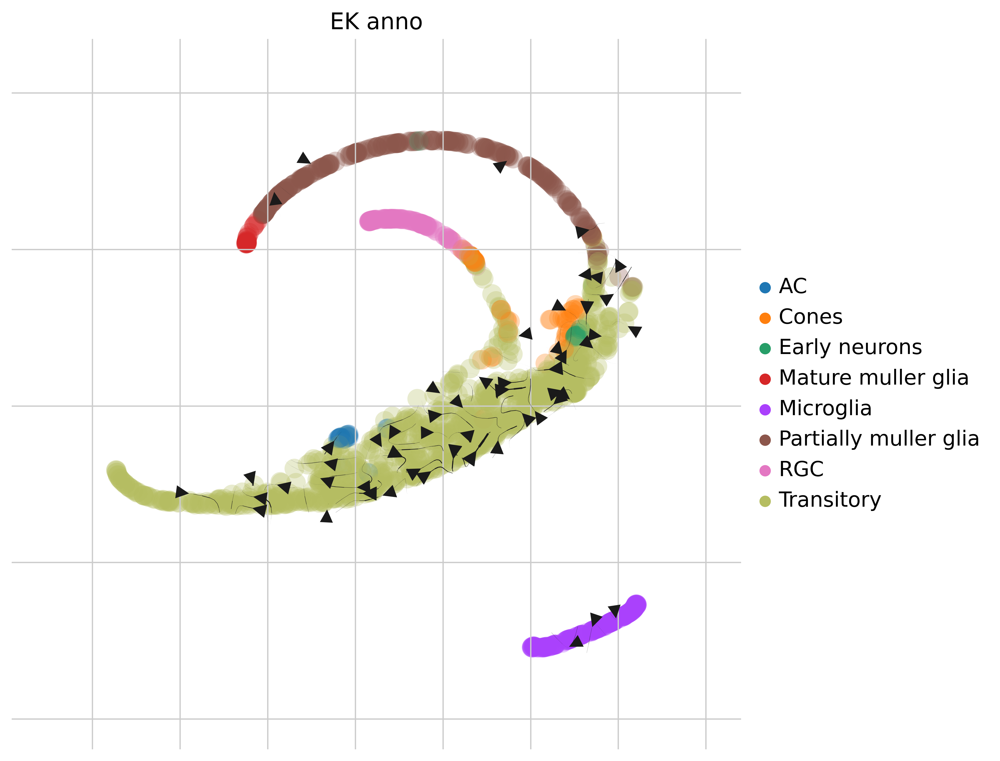

In [58]:
scv.pl.velocity_embedding_stream(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, density = 2, add_margin=0.2, arrow_size = 2, legend_loc = 'right margin')

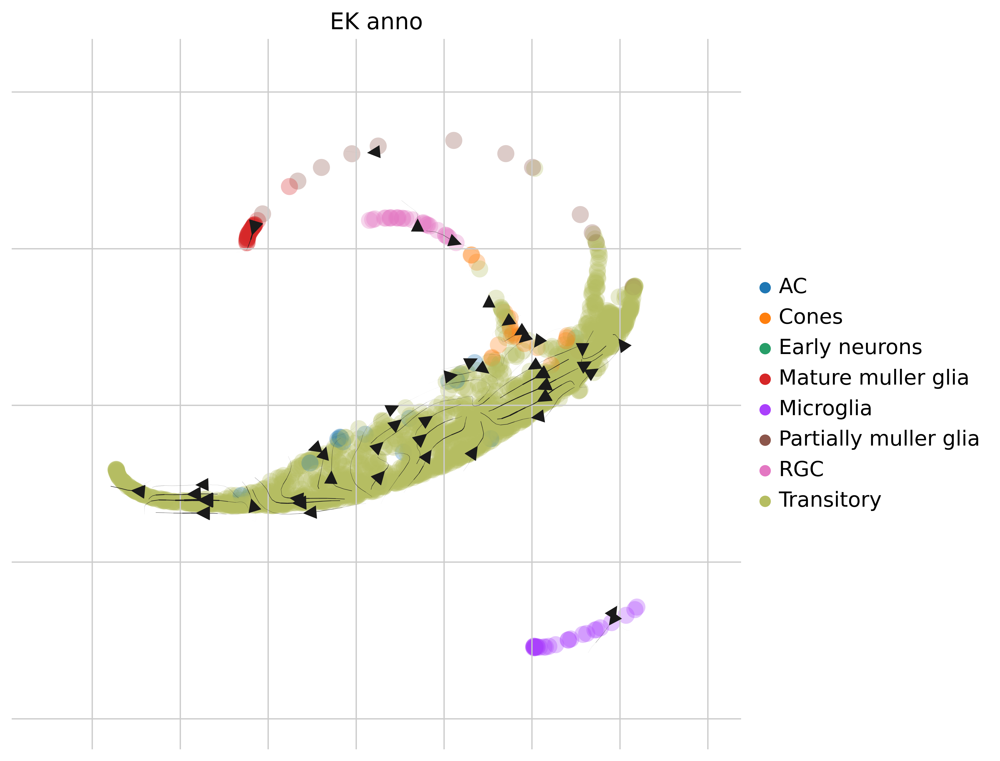

In [59]:
scv.pl.velocity_embedding_stream(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, density = 2, add_margin=0.2, arrow_size = 2, legend_loc = 'right margin')

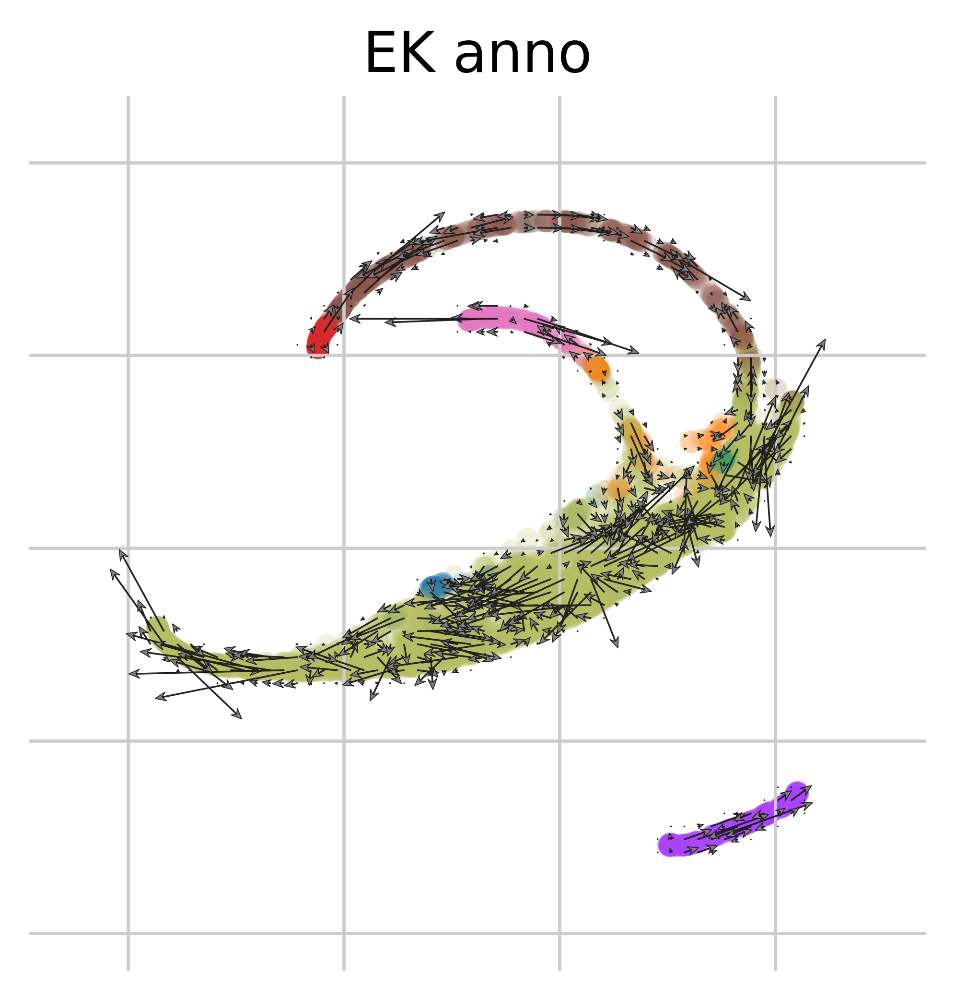

In [86]:
scv.pl.velocity_embedding_grid(mg_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

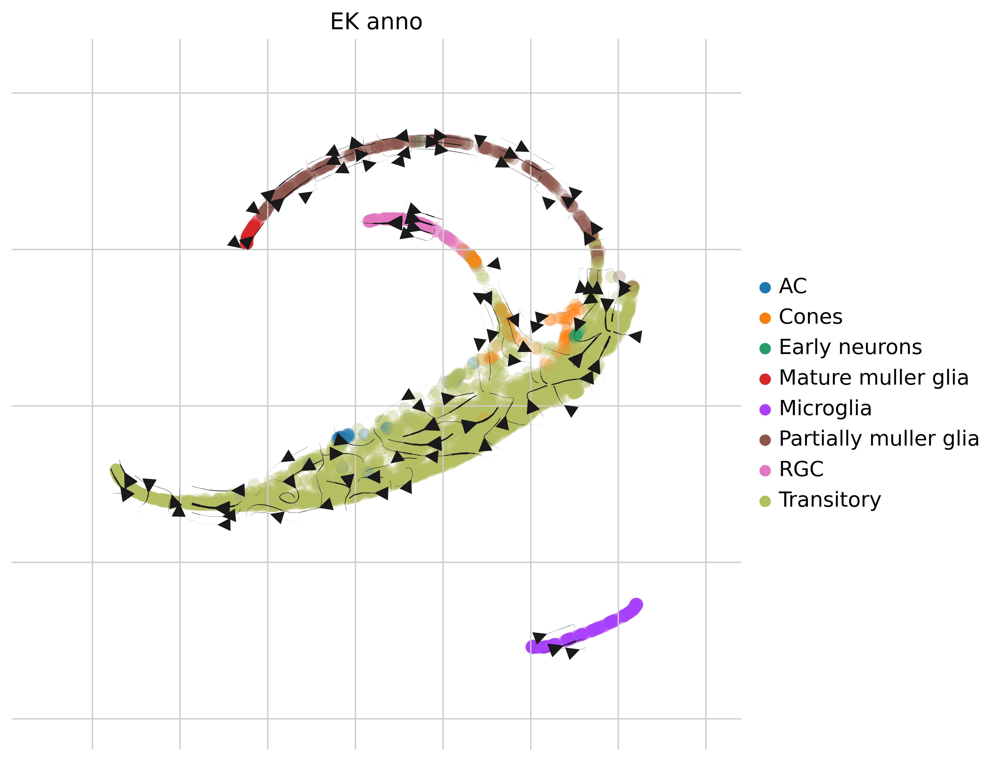

In [77]:
scv.pl.velocity_embedding_stream(mg_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, density = 2, add_margin=0.2, arrow_size = 2, legend_loc = 'right margin')

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


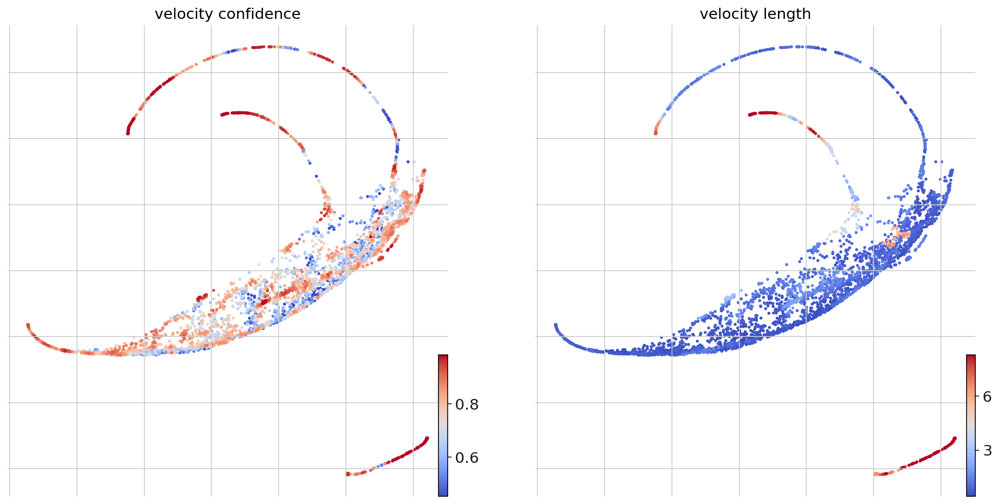

In [78]:
scv.tl.velocity_confidence(mg_velo)
keys =  'velocity_confidence','velocity_length'
scv.pl.scatter(mg_velo, c=keys, cmap='coolwarm', perc=[5, 95], basis='draw_graph_fa' )

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


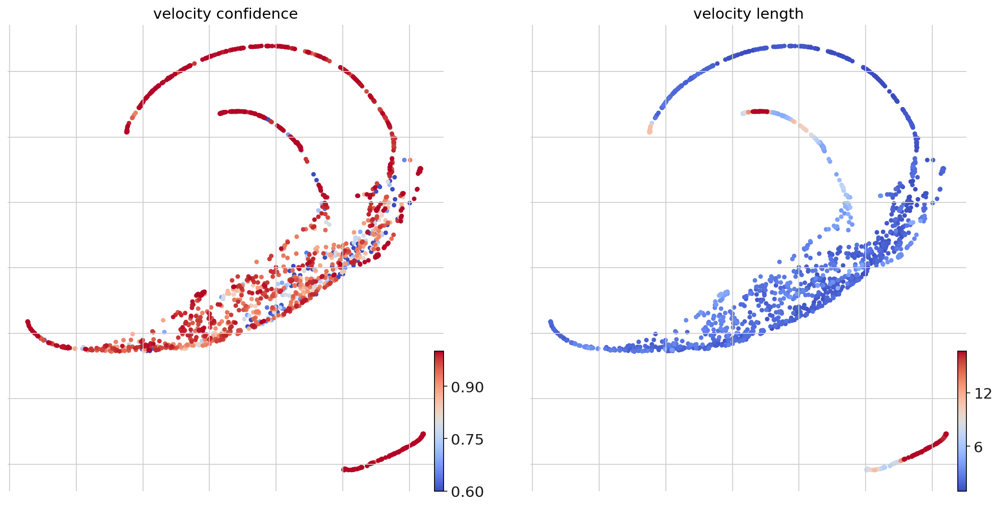

In [79]:
scv.tl.velocity_confidence(early_velo)
keys =  'velocity_confidence','velocity_length'
scv.pl.scatter(early_velo, c=keys, cmap='coolwarm', perc=[5, 95], basis='draw_graph_fa' )

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


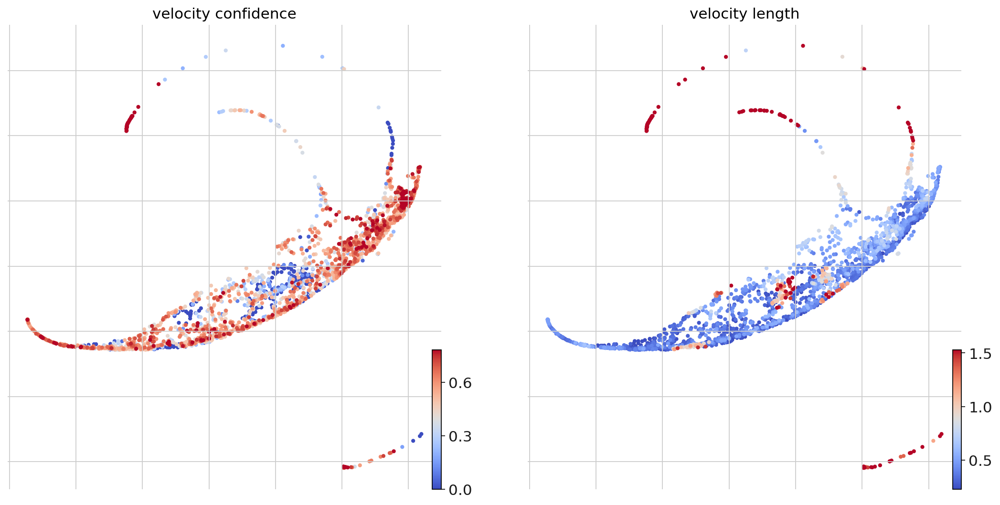

In [80]:
scv.tl.velocity_confidence(late_velo)
keys =  'velocity_confidence','velocity_length'
scv.pl.scatter(late_velo, c=keys, cmap='coolwarm', perc=[5, 95], basis='draw_graph_fa' )

computing terminal states
    identified 2 regions of root cells and 3 regions of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


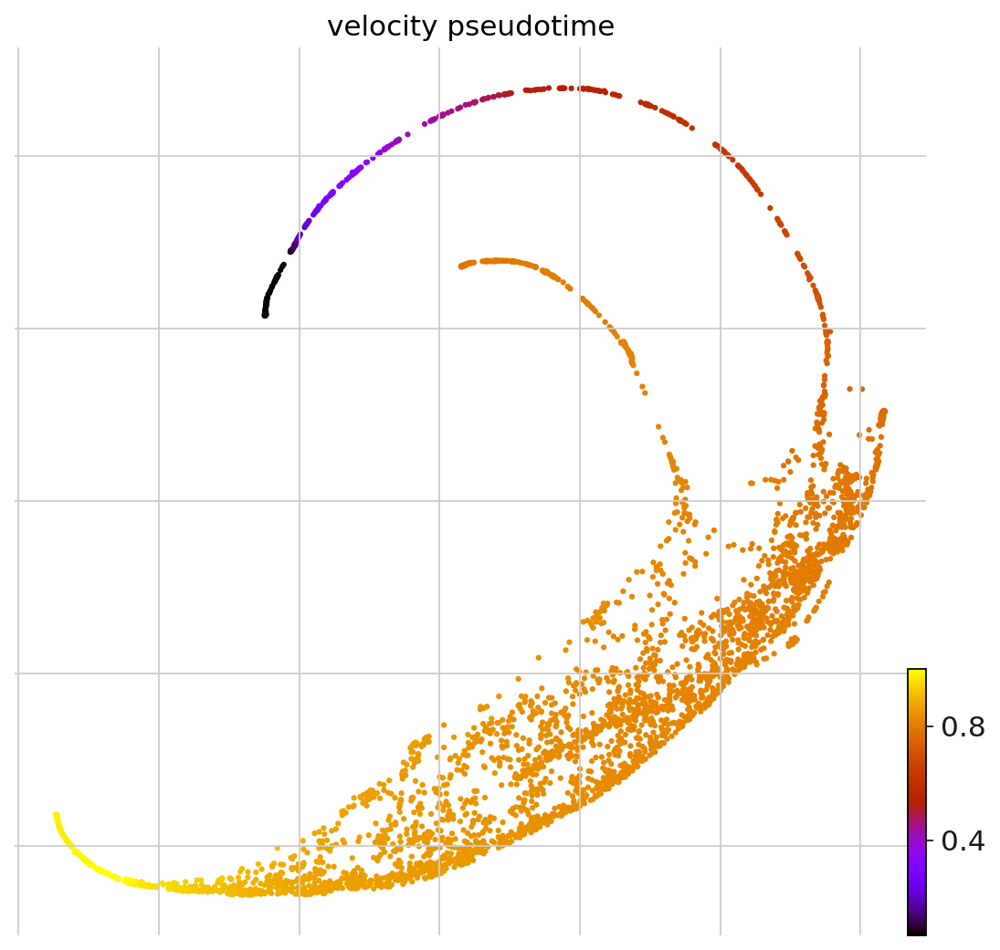

In [81]:
scv.tl.velocity_pseudotime(mg_velo)
scv.pl.scatter(mg_velo, color='velocity_pseudotime', cmap='gnuplot', basis='draw_graph_fa')

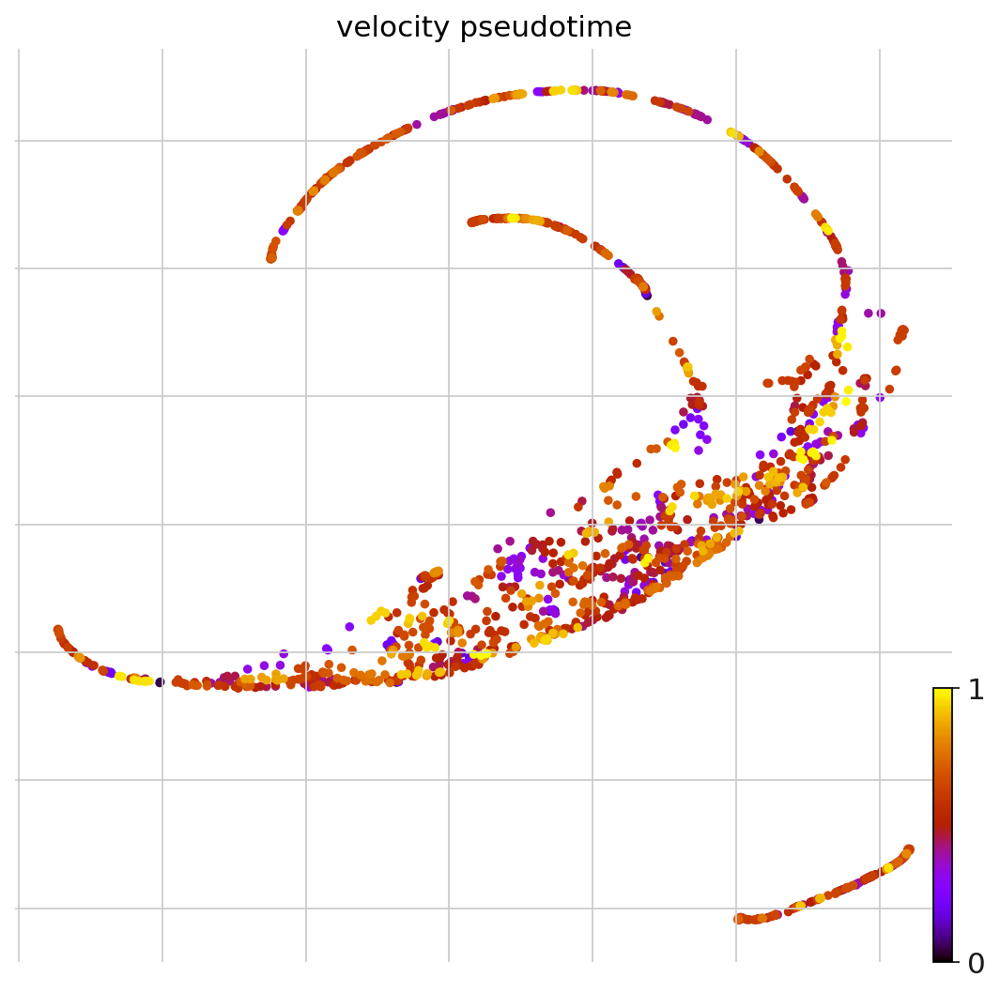

In [84]:
scv.tl.velocity_pseudotime(early_velo)
scv.pl.scatter(early_velo, color='velocity_pseudotime', cmap='gnuplot', basis='draw_graph_fa')

In [83]:
sc.pp.neighbors(early_velo)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


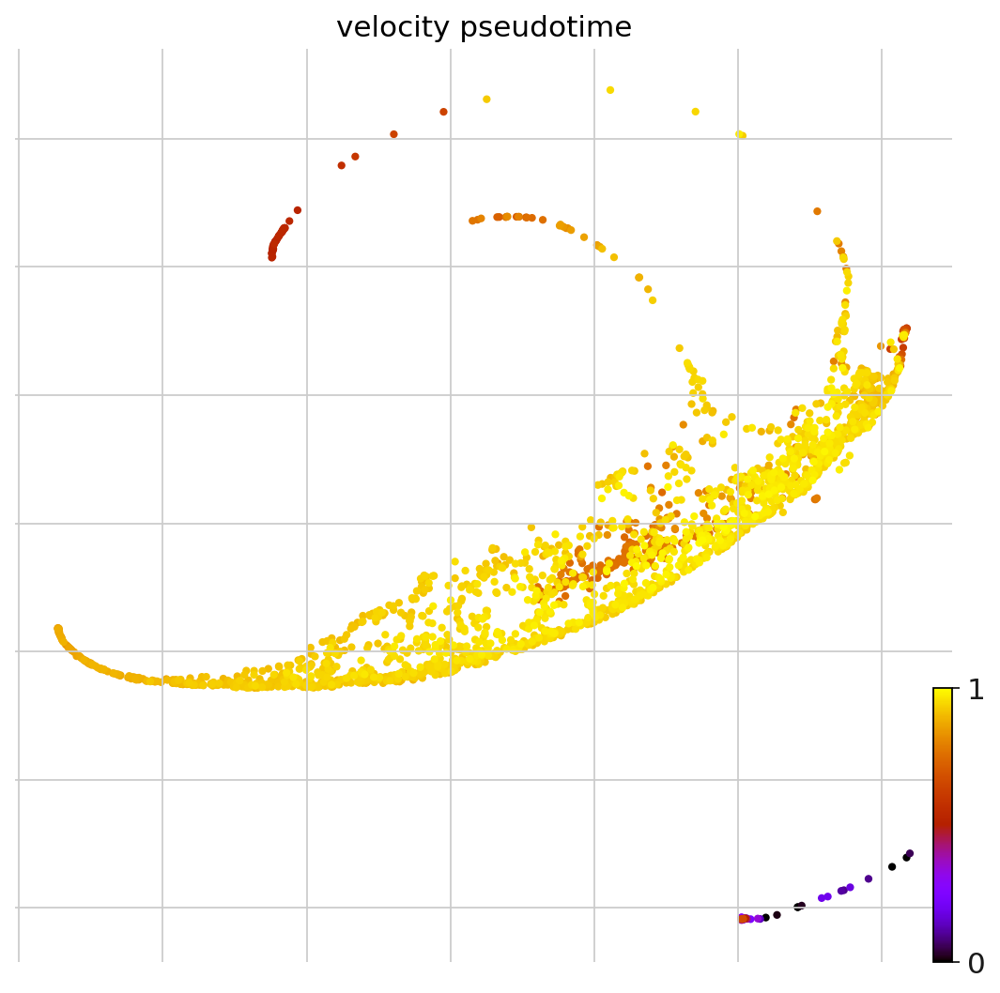

In [85]:
scv.tl.velocity_pseudotime(late_velo)
scv.pl.scatter(late_velo, color='velocity_pseudotime', cmap='gnuplot', basis='draw_graph_fa')

In [87]:
scv.tl.recover_dynamics(early_velo)
scv.tl.recover_dynamics(late_velo)
scv.tl.recover_dynamics(mg_velo)

recovering dynamics (using 1/12 cores)


  0%|          | 0/43 [00:00<?, ?gene/s]

    finished (0:00:15) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
recovering dynamics (using 1/12 cores)


  0%|          | 0/12 [00:00<?, ?gene/s]

    finished (0:00:05) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
recovering dynamics (using 1/12 cores)


*** stack smashing detected ***: terminated


  0%|          | 0/40 [00:00<?, ?gene/s]

    finished (0:00:26) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [93]:
scv.tl.recover_dynamics(late_velo)

recovering dynamics (using 1/12 cores)
    finished (0:00:03) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [94]:
scv.tl.velocity(late_velo, mode='dynamical')
scv.tl.velocity_graph(late_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/2172 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


*** stack smashing detected ***: terminated


In [88]:
scv.tl.velocity(early_velo, mode='dynamical')
scv.tl.velocity_graph(early_velo)
scv.tl.velocity(late_velo, mode='dynamical')
scv.tl.velocity_graph(late_velo)
scv.tl.velocity(mg_velo, mode='dynamical')
scv.tl.velocity_graph(mg_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/1634 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/2172 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/3806 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


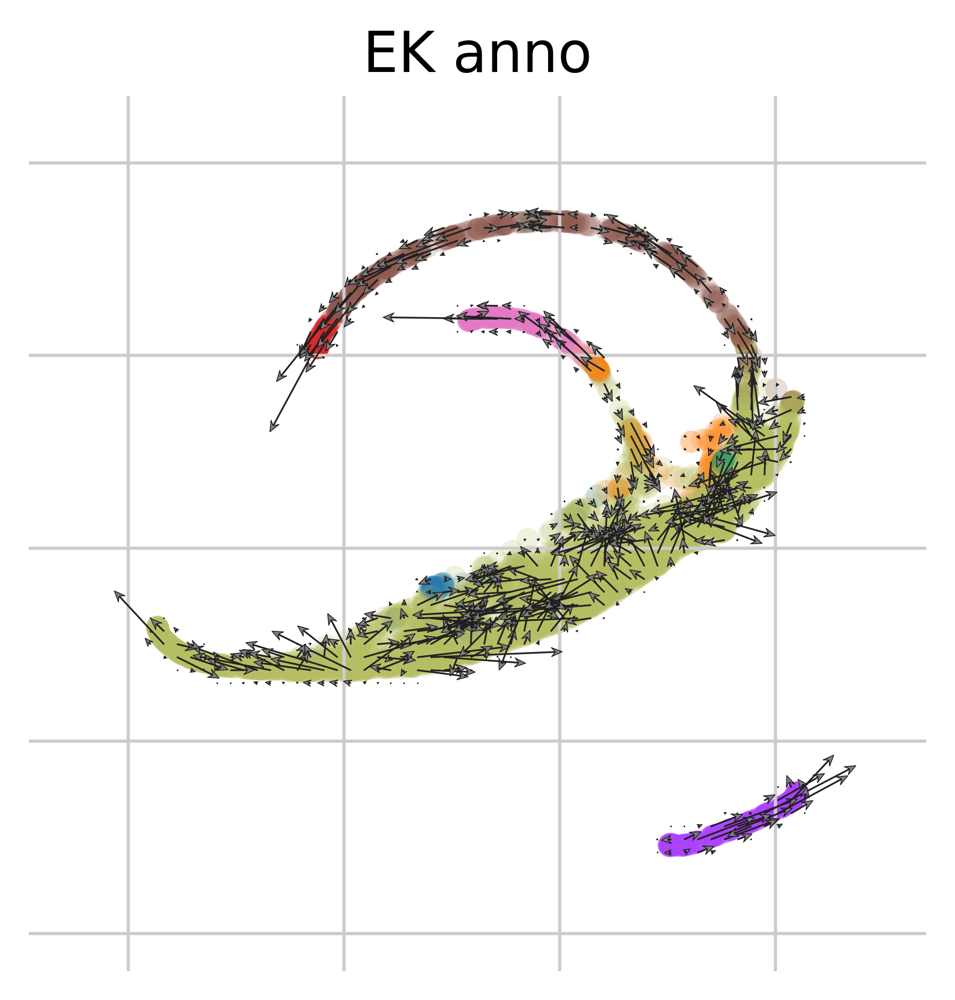

In [89]:
scv.pl.velocity_embedding_grid(mg_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


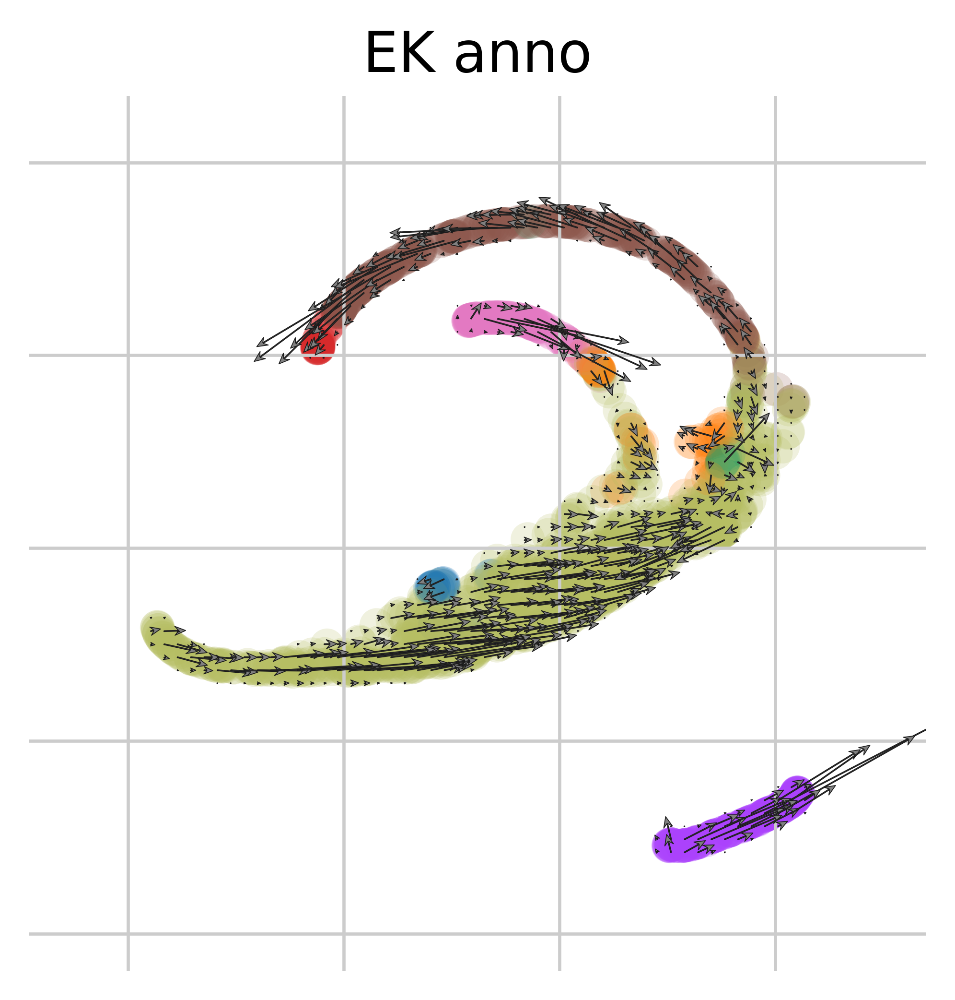

In [90]:
scv.pl.velocity_embedding_grid(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


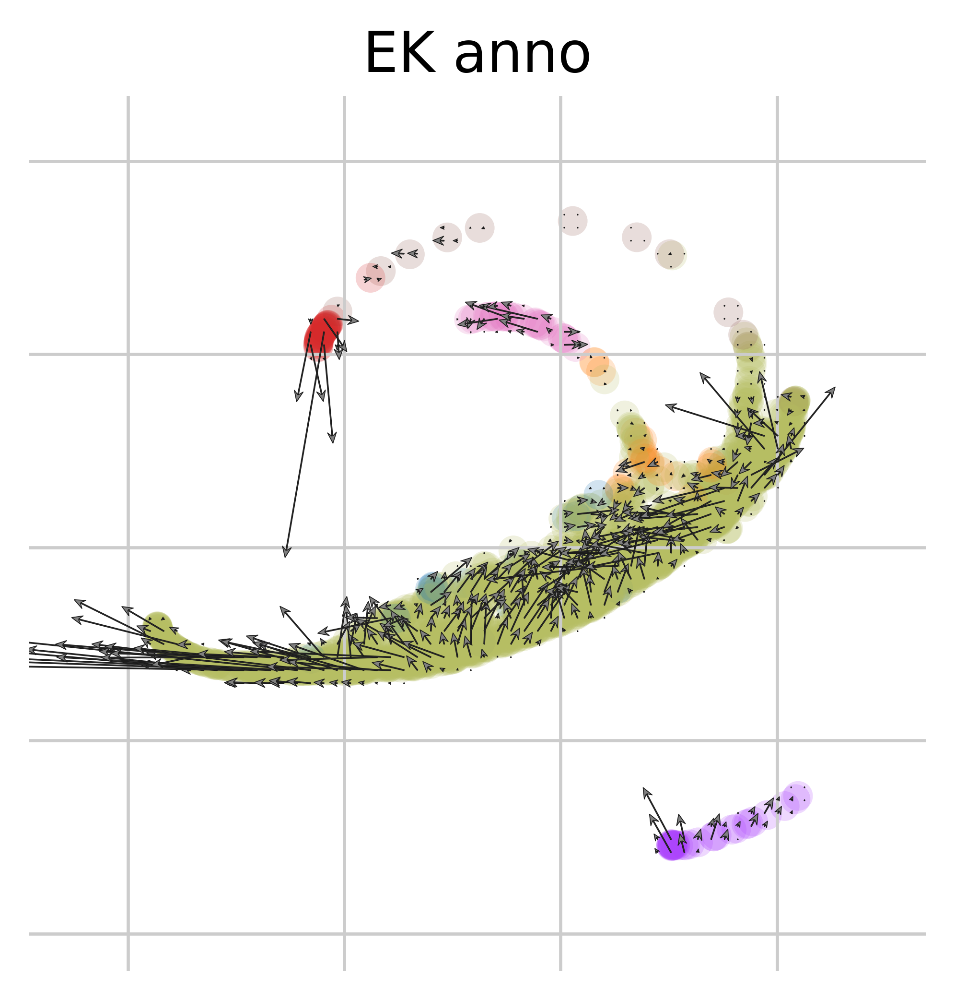

In [95]:
scv.pl.velocity_embedding_grid(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


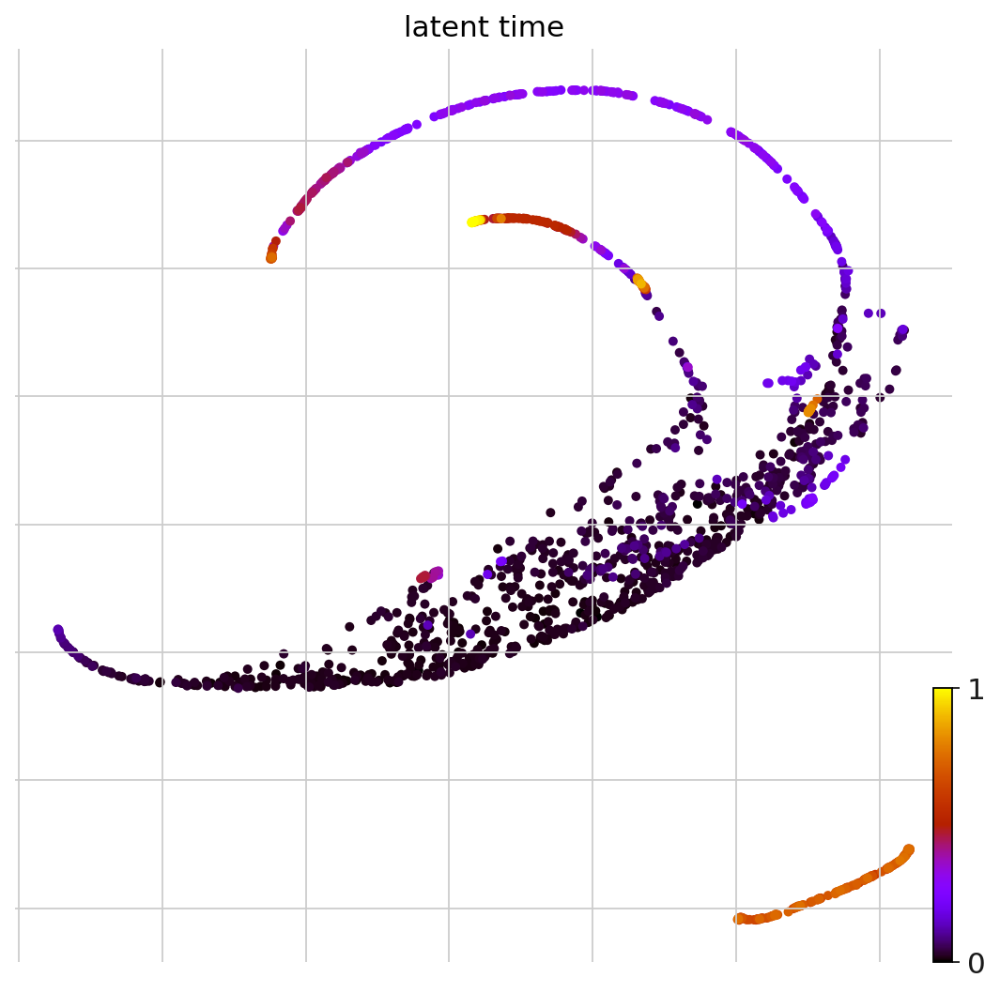

In [96]:
scv.tl.latent_time(early_velo)
scv.pl.scatter(early_velo, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa')

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


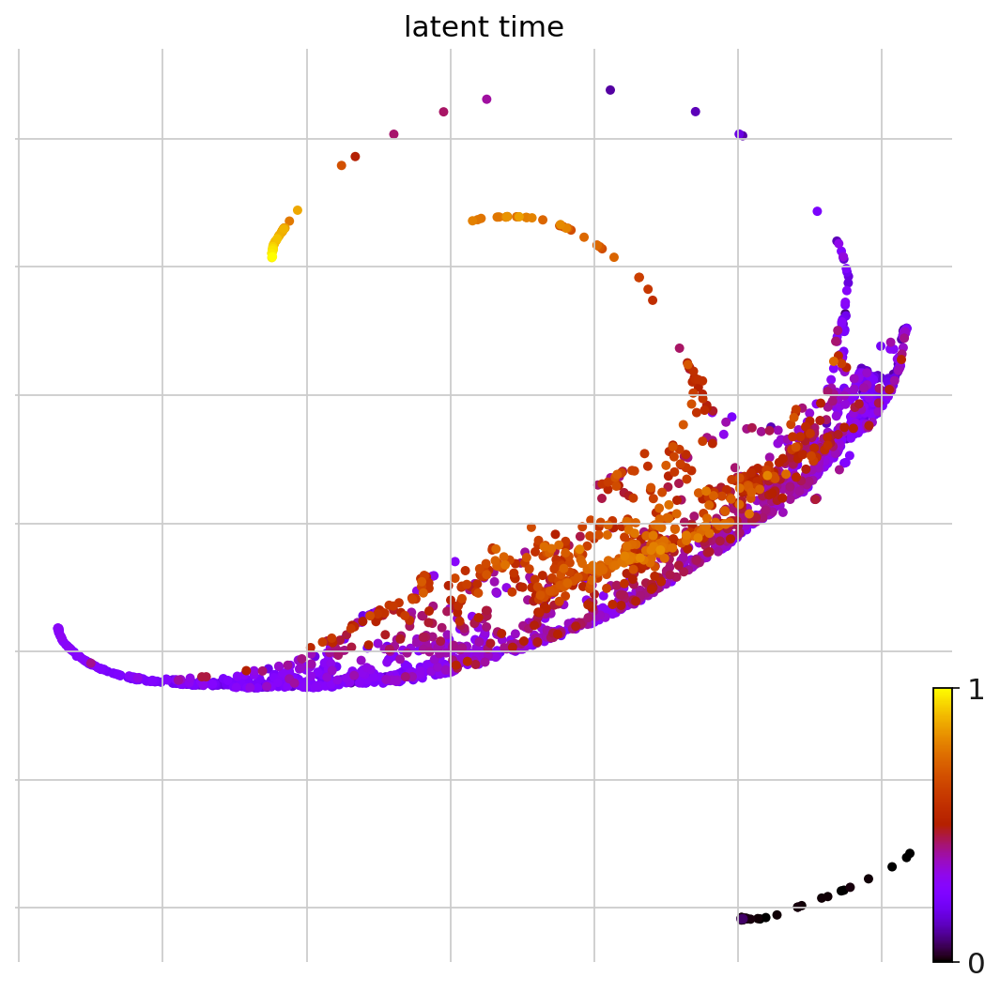

In [97]:
scv.tl.latent_time(late_velo)
scv.pl.scatter(late_velo, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa')

computing latent time using root_cells as prior
    finished (0:00:06) --> added 
    'latent_time', shared time (adata.obs)


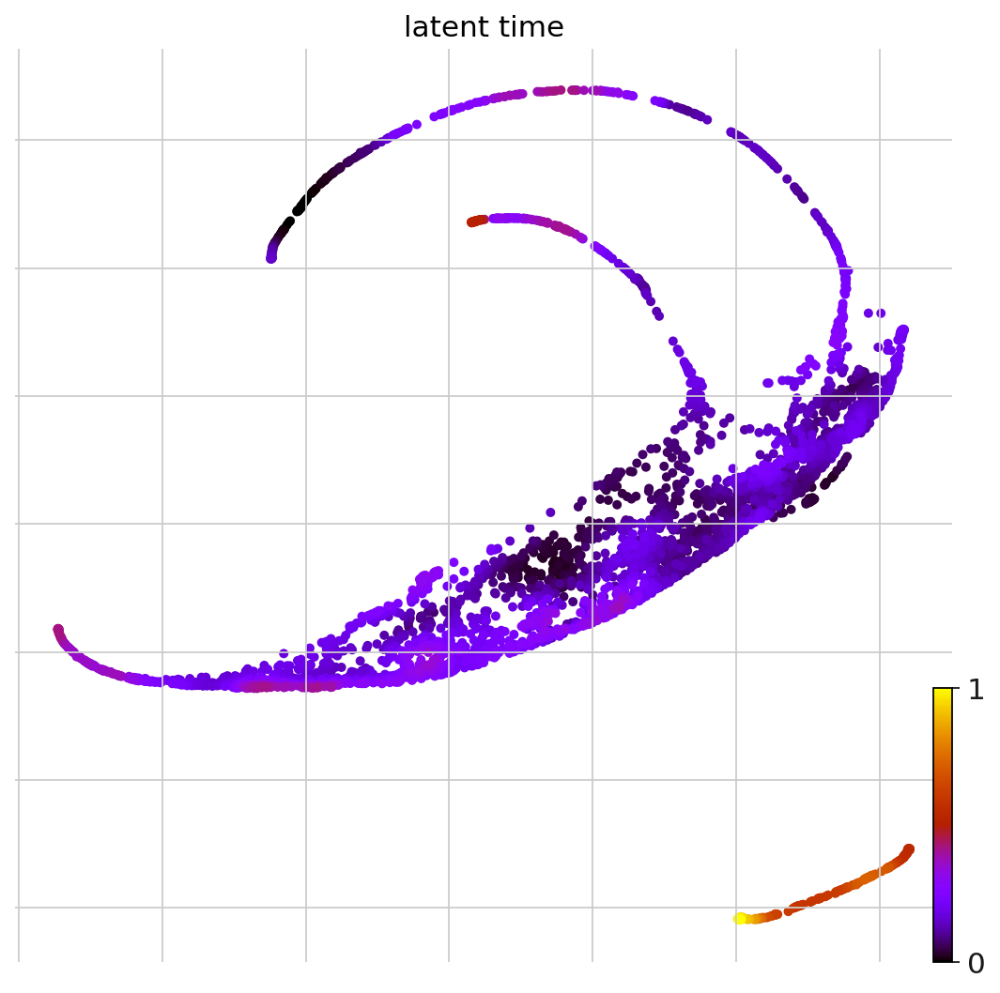

In [98]:
scv.tl.latent_time(mg_velo)
scv.pl.scatter(mg_velo, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa')

In [99]:
mg_velo.uns['neighbors']['distances'] = mg_velo.obsp['distances']
mg_velo.uns['neighbors']['connectivities'] = mg_velo.obsp['connectivities']

scv.tl.paga(mg_velo, groups='EK_anno')
df = scv.get_df(mg_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,AC,Cones,Early neurons,Mature muller glia,Microglia,Partially muller glia,RGC,Transitory
AC,0,0,0,0,0,0,0,0
Cones,0.015,0,0,0,0,0,0,0.11
Early neurons,0,0.028,0,0,0,0,0,0
Mature muller glia,0,0,0,0,0,0.034,0,0
Microglia,0,0,0,0,0,0,0,0
Partially muller glia,0,0,0,0,0,0,0,0.026
RGC,0,0,0,0,0,0,0,0
Transitory,0,0,0,0,0,0,0,0


In [100]:
early_velo.uns['neighbors']['distances'] = early_velo.obsp['distances']
early_velo.uns['neighbors']['connectivities'] = early_velo.obsp['connectivities']

scv.tl.paga(early_velo, groups='EK_anno')
df = scv.get_df(early_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,AC,Cones,Early neurons,Mature muller glia,Microglia,Partially muller glia,RGC,Transitory
AC,0,0,0,0,0,0,0,0.16
Cones,0,0,0,0,0,0.1,0,0.17
Early neurons,0,0,0,0,0,0,0,0
Mature muller glia,0,0,0,0,0,0,0,0
Microglia,0,0,0,0,0,0,0,0
Partially muller glia,0,0,0,0,0,0,0,0
RGC,0,0.025,0,0,0,0,0,0
Transitory,0,0,0,0,0,0,0,0


In [101]:
late_velo.uns['neighbors']['distances'] = late_velo.obsp['distances']
late_velo.uns['neighbors']['connectivities'] = late_velo.obsp['connectivities']

scv.tl.paga(late_velo, groups='EK_anno')
df = scv.get_df(late_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,AC,Cones,Early neurons,Mature muller glia,Microglia,Partially muller glia,RGC,Transitory
AC,0,0,0,0,0,0,0,0
Cones,0,0,0,0,0,0,0,0
Early neurons,0,0,0,0,0,0,0,0
Mature muller glia,0,0,0,0,0,0.25,0,0
Microglia,0,0,0,0,0,0,0,0.29
Partially muller glia,0,0,0,0,0,0,0,0.12
RGC,0.17,0.09,0,0,0,0,0,0.4
Transitory,0,0,0,0,0,0,0,0


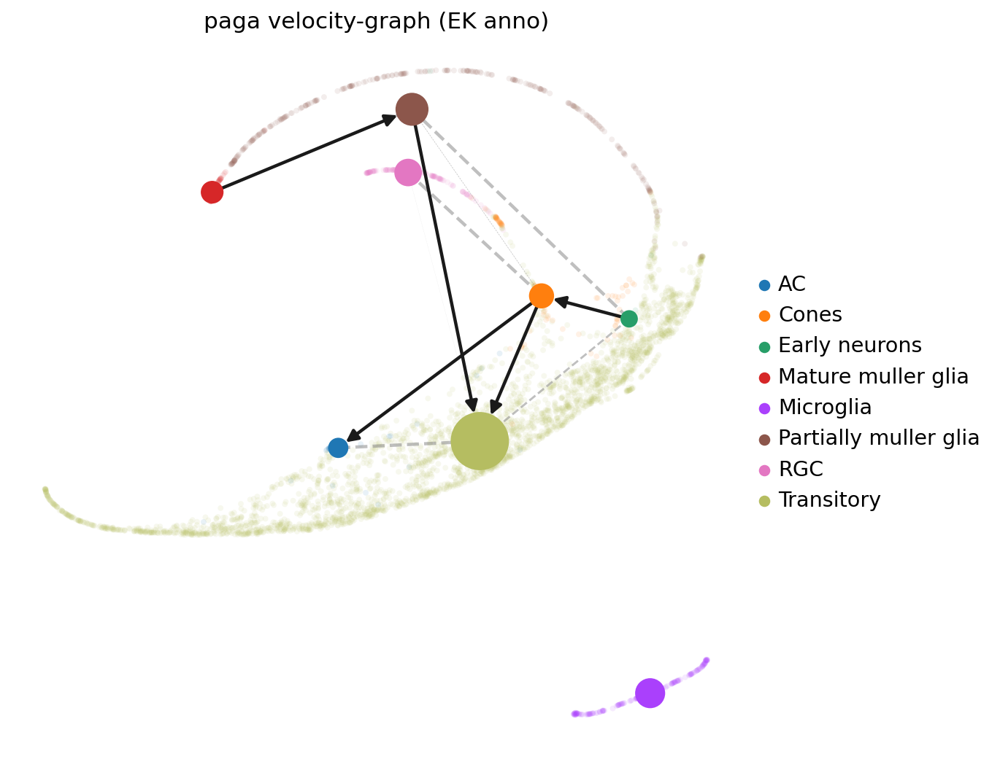

In [102]:
scv.pl.paga(mg_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

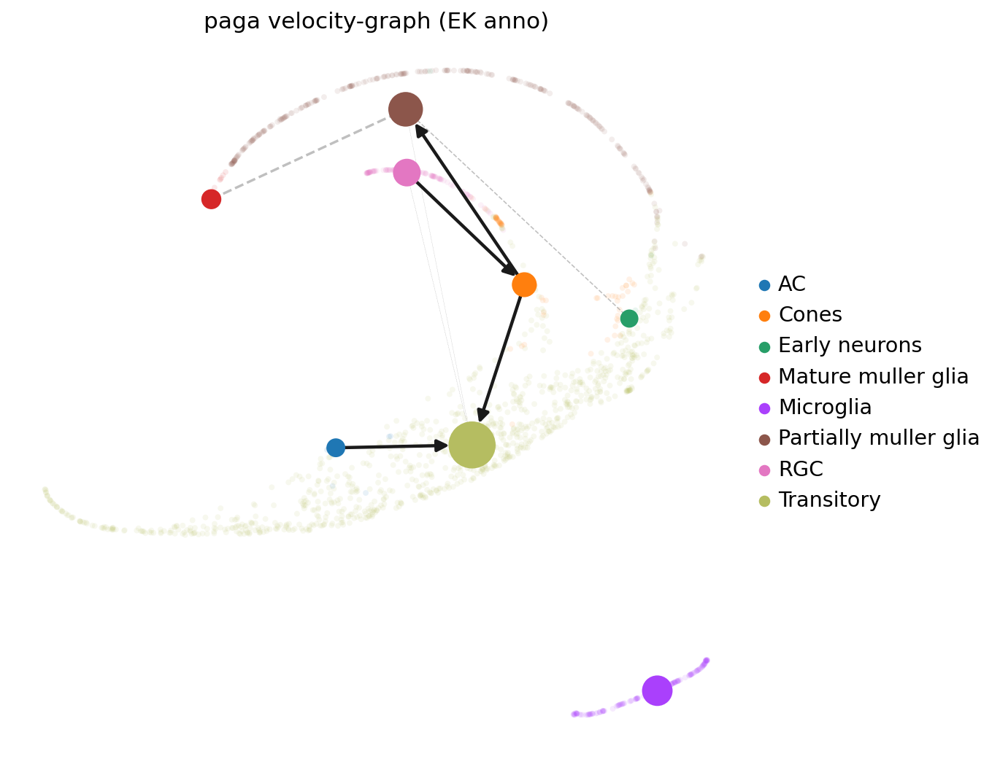

In [103]:
scv.pl.paga(early_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

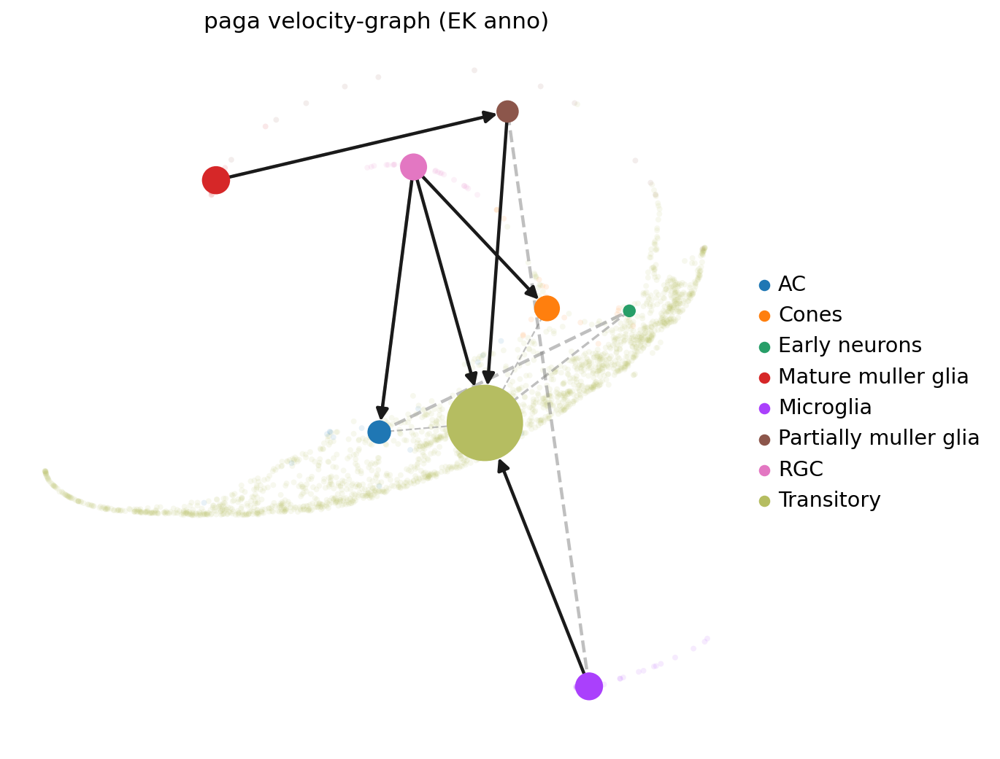

In [104]:
scv.pl.paga(late_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [105]:
sc.tl.leiden(early_velo)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [106]:
early_velo.uns['neighbors']['distances'] = early_velo.obsp['distances']
early_velo.uns['neighbors']['connectivities'] = early_velo.obsp['connectivities']

scv.tl.paga(early_velo, groups='leiden')
df = scv.get_df(early_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.31,0,0,0,0.34,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0.31,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0.13,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


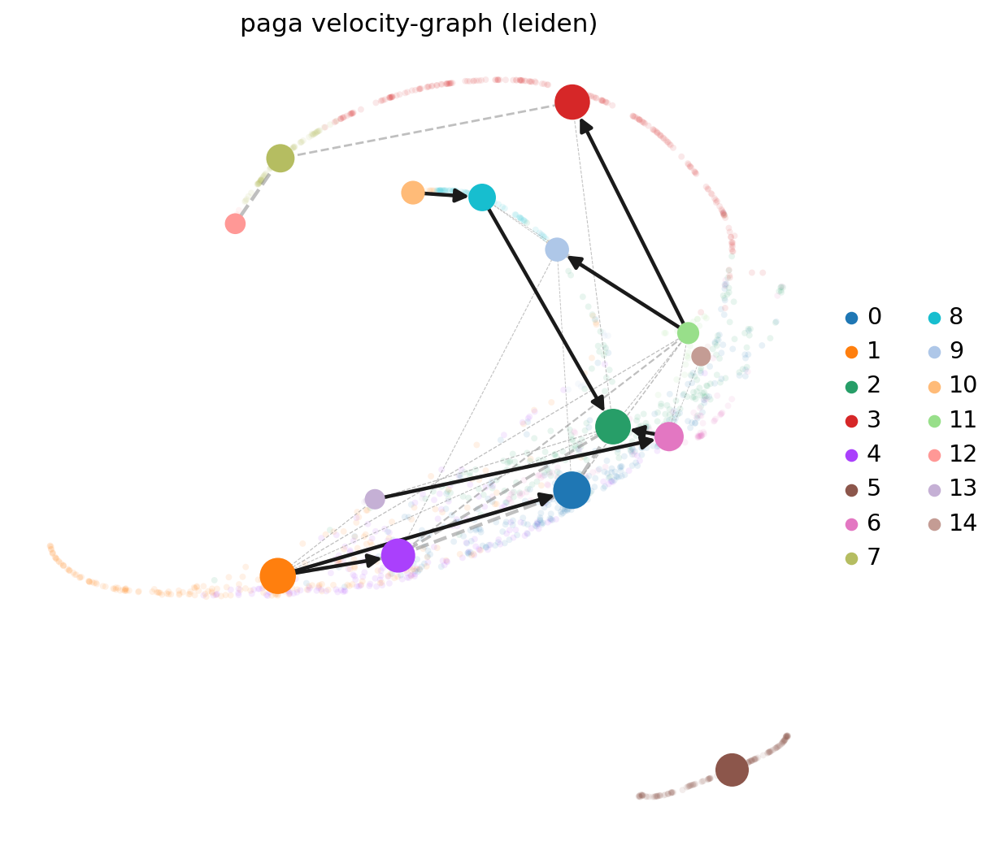

In [107]:
scv.pl.paga(early_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [108]:
import cellrank as cr

In [116]:
cr.tl.terminal_states(early_velo, cluster_key="leiden", weight_connectivities=0.2)

Using precomputed transition matrix
Computing eigendecomposition of the transition matrix
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
    Finish (0:00:02)
Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:24)
Computing `3` macrostates
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


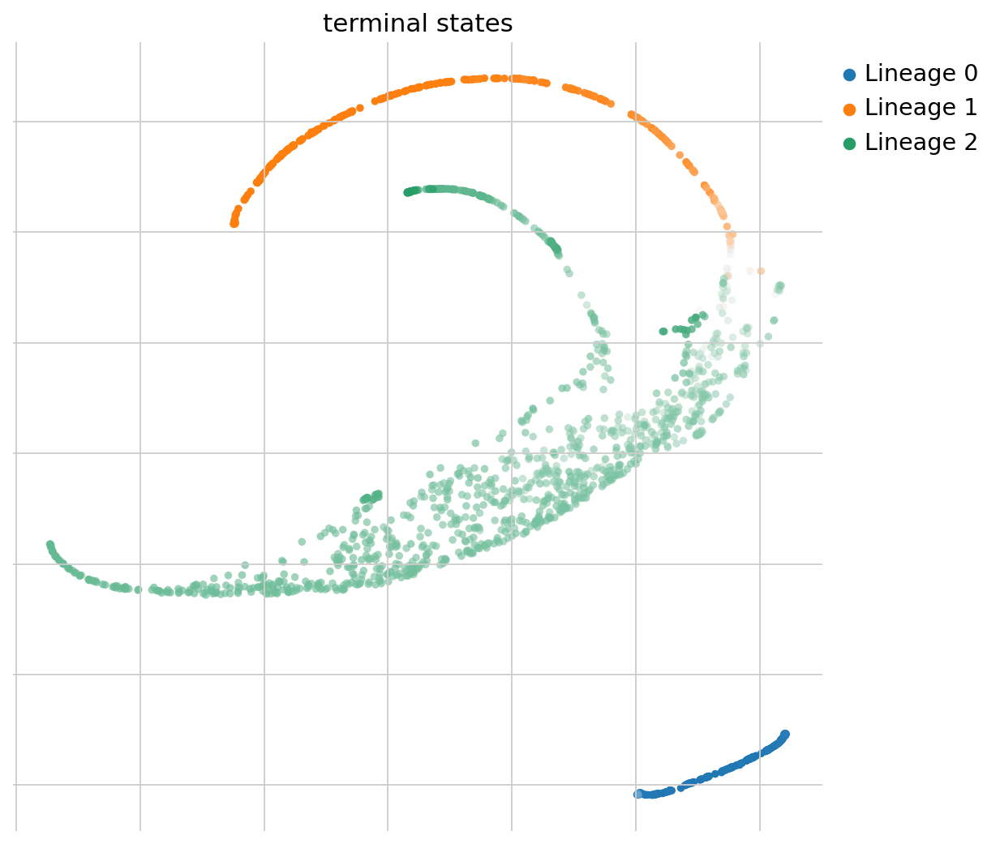

In [117]:
cr.pl.terminal_states(early_velo, basis = 'draw_graph_fa')

Using precomputed transition matrix
Computing eigendecomposition of the transition matrix
Adding `.eigendecomposition`
       `adata.uns['eig_bwd']`
    Finish (0:00:02)
Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_bwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:27)
Computing `5` macrostates
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
Adding `adata.obs['initial_states_probs']`
       `adata.obs['initial_states']`
       `adata.obsm['macrostates_bwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


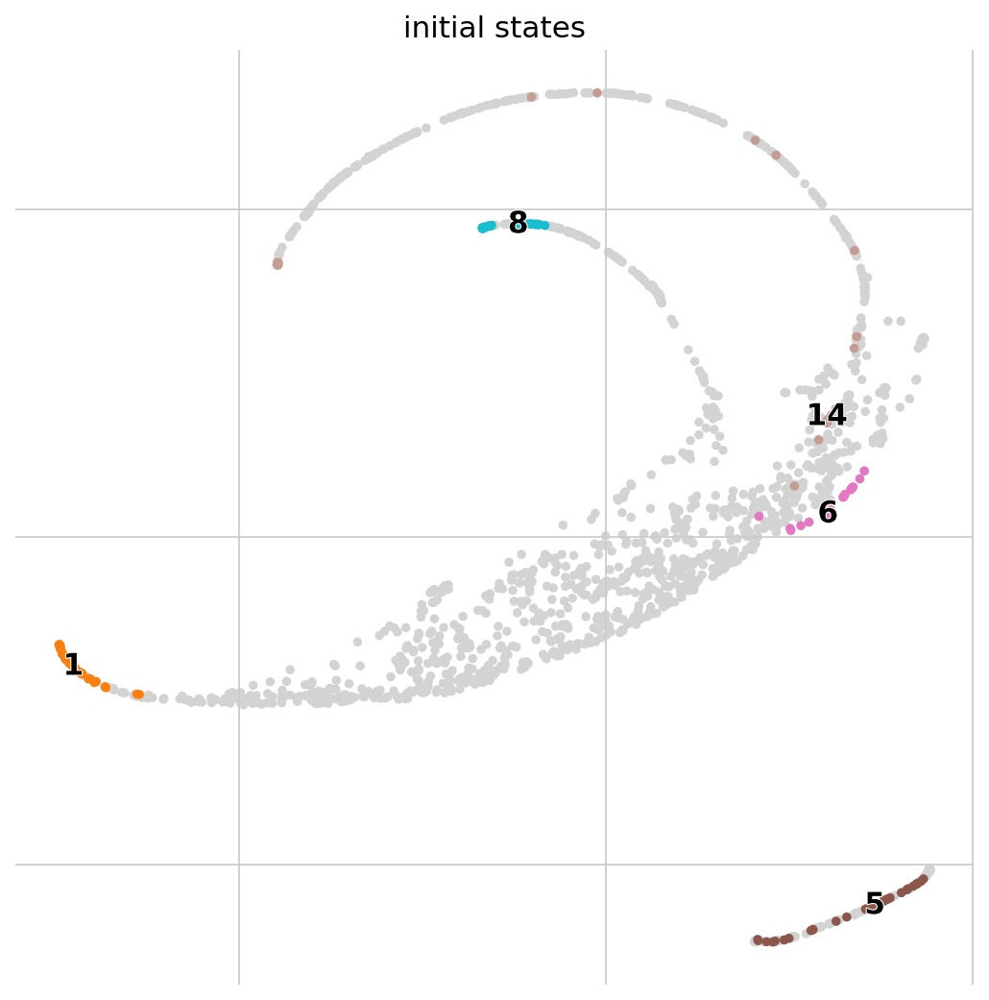

In [118]:
cr.tl.initial_states(early_velo, cluster_key="leiden")
cr.pl.initial_states(early_velo, discrete=True, basis = 'draw_graph_fa')

Computing lineage probabilities towards terminal states
Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:00)
Adding lineages to `adata.obsm['to_terminal_states']`
    Finish (0:00:00)


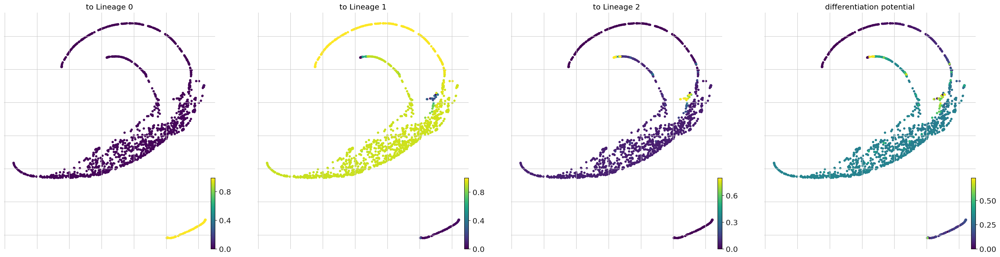

In [119]:
cr.tl.lineages(early_velo)
cr.pl.lineages(early_velo, same_plot=False, basis = 'draw_graph_fa')

In [120]:
scv.tl.recover_latent_time(
    early_velo, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [121]:
scv.tl.paga(
    early_velo,
    groups="leiden",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


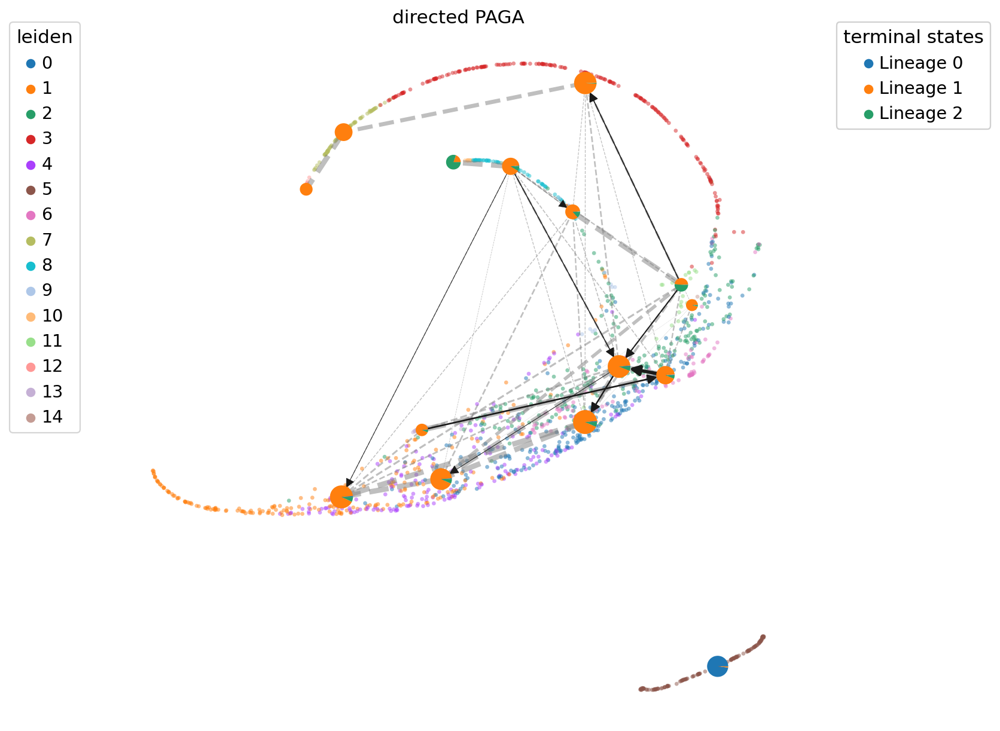

In [122]:
cr.pl.cluster_fates(
    early_velo,
    mode="paga_pie",
    cluster_key="leiden",
    basis="draw_graph_fa",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9992656  0.99459237 0.9933306  0.98805505 0.98430735
     0.9825391  0.97585315 0.9735275  0.96624535 0.96506    0.9606771
     0.954576   0.9316755  0.9287382 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


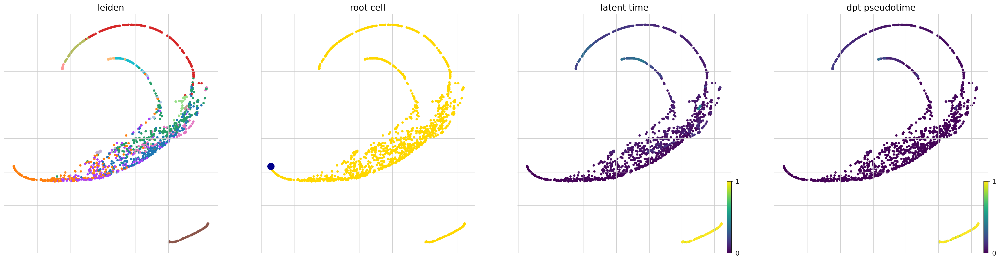

In [123]:
# compue DPT, starting from CellRank defined root cell
root_idx = np.where(early_velo.obs["initial_states"] == "1")[0][0]
early_velo.uns["iroot"] = root_idx
sc.tl.dpt(early_velo)

scv.pl.scatter(
    early_velo, basis = 'draw_graph_fa',
    color=["leiden", root_idx, "latent_time", "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["leiden", "root cell", "latent time", "dpt pseudotime"],
)

In [124]:
cr.tl.lineage_drivers(early_velo)

Computing correlations for lineages `['Lineage 0' 'Lineage 1' 'Lineage 2']` restricted to clusters `None` in layer `X` with `use_raw=False`
Adding `.lineage_drivers`
       `adata.var['to Lineage 0 corr']`
       `adata.var['to Lineage 1 corr']`
       `adata.var['to Lineage 2 corr']`
    Finish (0:00:04)


,Lineage 0 corr,Lineage 0 pval,Lineage 0 qval,Lineage 0 ci low,Lineage 0 ci high,Lineage 1 corr,Lineage 1 pval,Lineage 1 qval,Lineage 1 ci low,Lineage 1 ci high,Lineage 2 corr,Lineage 2 pval,Lineage 2 qval,Lineage 2 ci low,Lineage 2 ci high
Mef2c,0.90,0.00e+00,0.00e+00,0.89,0.90,-0.80,0.00e+00,0.00e+00,-0.82,-0.78,-0.13,1.09e-07,6.70e-07,-1.78e-01,-8.28e-02
Lyn,0.83,0.00e+00,0.00e+00,0.81,0.84,-0.73,7.35e-309,4.30e-307,-0.75,-0.71,-0.14,1.21e-08,8.35e-08,-1.87e-01,-9.23e-02
Lair1,0.81,0.00e+00,0.00e+00,0.79,0.82,-0.71,3.91e-280,1.52e-278,-0.73,-0.68,-0.14,6.20e-09,4.53e-08,-1.90e-01,-9.51e-02
Inpp5d,0.76,0.00e+00,0.00e+00,0.74,0.78,-0.67,2.31e-235,6.76e-234,-0.70,-0.64,-0.13,1.40e-07,8.21e-07,-1.77e-01,-8.16e-02
Fyb,0.75,0.00e+00,0.00e+00,0.73,0.77,-0.66,1.47e-226,2.86e-225,-0.69,-0.63,-0.13,3.20e-07,1.70e-06,-1.73e-01,-7.79e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tnnt1,-0.34,1.81e-47,7.32e-47,-0.39,-0.30,0.25,7.09e-26,2.31e-25,0.21,0.30,0.16,9.55e-11,8.59e-10,1.11e-01,2.06e-01
Syt1,-0.37,5.48e-54,2.29e-53,-0.41,-0.32,0.28,4.76e-31,1.69e-30,0.23,0.32,0.15,7.82e-10,6.53e-09,1.03e-01,1.98e-01
Celf4,-0.40,2.16e-65,9.71e-65,-0.44,-0.36,0.36,3.35e-53,1.51e-52,0.32,0.40,0.05,6.80e-02,9.36e-02,-3.34e-03,9.35e-02
Dync1i1,-0.41,1.28e-67,5.97e-67,-0.45,-0.36,0.42,9.08e-74,5.31e-73,0.38,0.46,-0.07,8.27e-03,1.70e-02,-1.13e-01,-1.69e-02


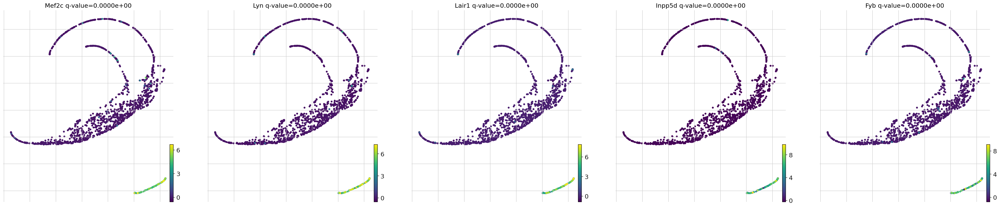

In [128]:
cr.pl.lineage_drivers(early_velo, lineage="Lineage 0", n_genes=5, basis = 'draw_graph_fa')

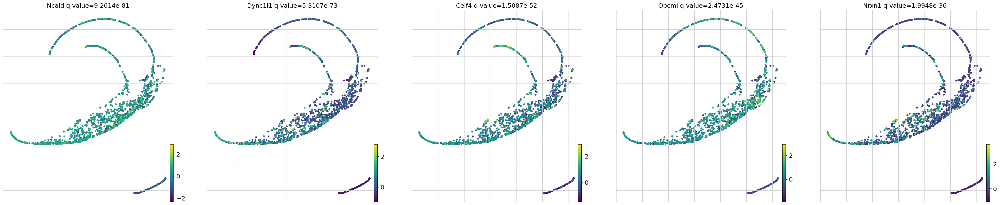

In [129]:
cr.pl.lineage_drivers(early_velo, lineage="Lineage 1", n_genes=5, basis = 'draw_graph_fa')

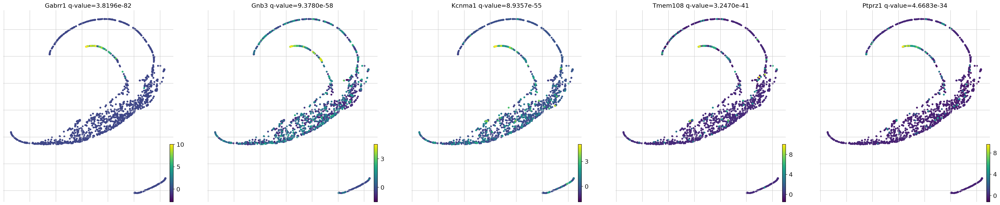

In [130]:
cr.pl.lineage_drivers(early_velo, lineage="Lineage 2", n_genes=5, basis = 'draw_graph_fa')

In [134]:
model = cr.ul.models.GAM(early_velo)
cr.pl.gene_trends(
    early_velo,
    model=model,
    data_key="X",
    genes=["Mef2c"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200
)

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:00)


RuntimeError: Fatal model failure `<FailedModel[origin=GAM[gene='Mef2c', lineage='Lineage 0', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0), tol=0.0001, verbose=False)]]>`.

In [136]:
cr.pl.heatmap(
    early_velo,
    model,
    genes=early_velo.varm['terminal_lineage_drivers']["Lineage_0_corr"].sort_values(ascending=False).index[:100],
    show_absorption_probabilities=True,
    lineages="Lineage 0",
    n_jobs=1,
    backend="loky",
)

KeyError: 'terminal_lineage_drivers'

Solving TSP for `3` states


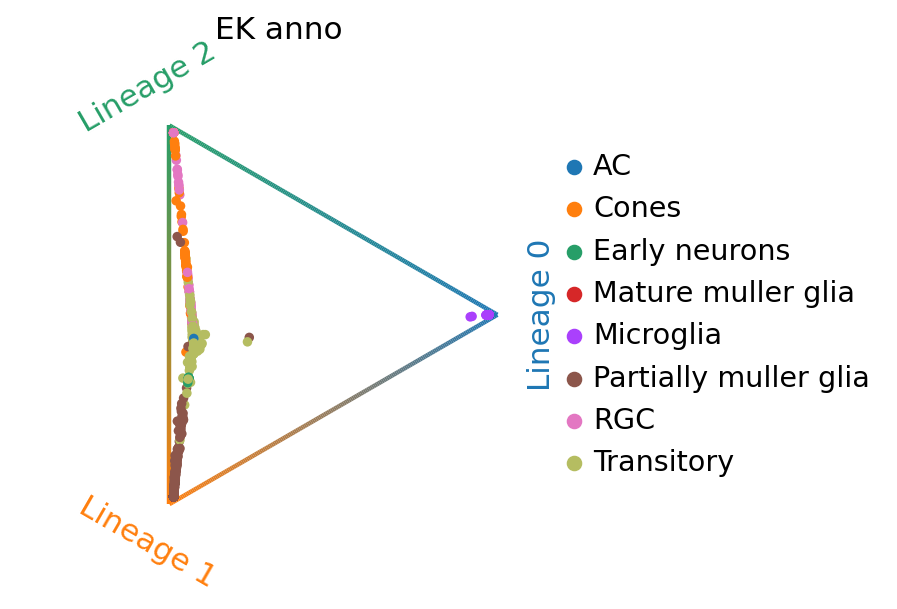

In [141]:
cr.pl.circular_projection(early_velo, keys="EK_anno", legend_loc="right")